# Import Dependencies

In [1]:
import atd2022
import torch
import pandas as pd
import numpy as np
from atd_informer import atd_informer
from utils.tools import dotdict
from atd_wrapper import InformerForcaster
pd.set_option('display.max_columns', None)
from sktime.performance_metrics.forecasting import (
    MeanAbsoluteScaledError,
    MeanSquaredError,
)

In [2]:
import importlib
importlib.reload(atd_informer)

<module 'atd_informer.atd_informer' from '/scratch/wzong/LISP-ATD-2022/Informer/atd_informer/atd_informer.py'>

In [3]:
import torch
torch.cuda.is_available()

True

# Small Scale Testing (pls ignore)

In [3]:
args = dotdict()


args.enc_in = 20 # encoder input size
args.dec_in = 20 # decoder input size
args.c_out = 20 # output size
args.factor = 5 # probsparse attn factor
args.d_model = 512 # dimension of model
args.n_heads = 8 # num of heads
args.e_layers = 2 # num of encoder layers
args.d_layers = 1 # num of decoder layers
args.d_ff = 2048 # dimension of fcn in model
args.dropout = 0.05 # dropout
args.attn = 'prob' # attention used in encoder, options:[prob, full]
args.embed = 'timeF' # time features encoding, options:[timeF, fixed, learned]
args.activation = 'gelu' # activation
args.distil = True # whether to use distilling in encoder
args.output_attention = False # whether to output attention in ecoder
args.mix = True
args.padding = 0
args.freq = 'w'
args.inverse=False
args.timeenc=0

args.cols=1
args.checkpoints = "/Users/will/Desktop/tmp"



args.seq_len=5
args.label_len=3
args.pred_len=1


args.batch_size = 1
args.learning_rate = 0.0001
args.loss = 'mse'
args.lradj = 'type1'
args.use_amp = False

args.itr=1
args.train_epochs=1
args.patience=3

In [4]:
informer = atd_informer.ATD_Informer

#### Model Training (ignore pls)

In [5]:
for ii in range(args.itr):
        # setting record of experiments
    setting = '{}_{}_ft{}_sl{}_ll{}_pl{}_dm{}_nh{}_el{}_dl{}_df{}_at{}_fc{}_eb{}_dt{}_mx{}_{}_{}'.format(args.model, args.data, args.features, 
                args.seq_len, args.label_len, args.pred_len,
                args.d_model, args.n_heads, args.e_layers, args.d_layers, args.d_ff, args.attn, args.factor, args.embed, args.distil, args.mix, args.des, ii)

    # set experiments
    exp = informer(args)
    
    # train
    print('>>>>>>>start training : {}>>>>>>>>>>>>>>>>>>>>>>>>>>'.format(setting))
    exp.train(setting)
    
    # test
    print('>>>>>>>testing : {}<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<'.format(setting))
    exp.test(setting)
    

TypeError: __init__() missing 1 required positional argument: 'df'

### Generate Prediction (Ignore Pls)

#setting = '{}_{}_ft{}_sl{}_ll{}_pl{}_dm{}_nh{}_el{}_dl{}_df{}_at{}_fc{}_eb{}_dt{}_mx{}_{}_{}'.format(args.model, args.data, args.features, 
                                                                                                     args.seq_len, args.label_len, args.pred_len,
                                                                                                     args.d_model, args.n_heads, args.e_layers, args.d_layers,
                                                                                                     args.d_ff, args.attn, args.factor, args.embed, args.distil, 
                                                                                                     args.mix, args.des)

In [6]:
setting= "string"

In [7]:
exp.predict(setting)


check data_x shape (8, 20)
check data_y shape (8, 20)
data_x [[ 3  3  4 21  3  4  0  5  0  0  0  0  0  0  0  0 14  0  1  0]
 [ 0  0  0  3  0  0  2  1  0  0  0  1  0  0  0  0  1  0  0  0]
 [ 7  5 26 22  5  0  0  1  1  0  3  1  0  0  0  0  1  0  0  0]
 [13  9 20 85  4  2  0  2  8  0  0  0  0  0  0  1  8  0  0  0]
 [14  5  8 10  1  0  0  1  0  1  0  1  0  0  0  0  3  0  2  0]
 [ 5  2  0 23  3  2  5  1  0  0  2  0  0  0  0  3  4  0  4  0]
 [ 3  2  7 37  6 10  4  7  0  1  1  1  0  0  0  0  0  0  0  0]
 [ 7  6  7 49  6  0  1  2  2  2  6  0  1  0  0  0  2  0  4  0]]
data_y [[ 3  3  4 21  3  4  0  5  0  0  0  0  0  0  0  0 14  0  1  0]
 [ 0  0  0  3  0  0  2  1  0  0  0  1  0  0  0  0  1  0  0  0]
 [ 7  5 26 22  5  0  0  1  1  0  3  1  0  0  0  0  1  0  0  0]
 [13  9 20 85  4  2  0  2  8  0  0  0  0  0  0  1  8  0  0  0]
 [14  5  8 10  1  0  0  1  0  1  0  1  0  0  0  0  3  0  2  0]
 [ 5  2  0 23  3  2  5  1  0  0  2  0  0  0  0  3  4  0  4  0]
 [ 3  2  7 37  6 10  4  7  0  1  1  1  0  0  0  

In [8]:
prediction = np.load('./results/'+setting+'/real_prediction.npy')

prediction.shape

(4, 1, 20)

In [9]:
prediction

array([[[ 6.8321867e+00,  4.1660962e+00,  5.5001898e+00,  1.3873180e+01,
          4.5615072e+00,  1.6799215e+00,  1.7307360e+00,  1.9218162e+00,
          1.6953726e+00,  1.4328616e+00,  1.7674569e+00,  1.1856138e+00,
          7.7103615e-01,  3.1425217e-01,  2.0257424e-01,  6.5961373e-01,
          1.4129713e+00,  3.5161200e-01,  1.3668158e+00, -7.2176936e-03]],

       [[ 6.8742909e+00,  3.9449117e+00,  5.3744726e+00,  1.3874529e+01,
          4.5440998e+00,  1.5384877e+00,  1.7218031e+00,  1.8847367e+00,
          1.8090762e+00,  1.4132628e+00,  1.6957563e+00,  1.2538692e+00,
          8.0295253e-01,  3.5027868e-01,  2.6355246e-01,  6.1726761e-01,
          1.4184737e+00,  3.3506823e-01,  1.2761524e+00, -3.8309142e-02]],

       [[ 6.8484159e+00,  4.1268854e+00,  5.3488512e+00,  1.3879792e+01,
          4.6213698e+00,  1.5509696e+00,  1.6716541e+00,  2.0483508e+00,
          1.7572607e+00,  1.5358107e+00,  1.7793263e+00,  1.2569684e+00,
          8.8902807e-01,  4.5104560e-01,  1.3

# Testing ATD Protocal (Passed)

In [4]:
truth = atd2022.io.read_csv()

In [10]:
test = truth[["AA", "AC"]]

In [11]:
test.head()

Region                AA                                                      \
Event                 01 02  03  04 05   06 07 08 09 10 11 12 13 14 15 16 17   
2013-12-30/2014-01-05  0  0   0   6  0    0  0  0  0  0  0  0  0  0  0  0  0   
2014-01-06/2014-01-12  2  0   0  11  0    1  0  0  0  0  0  0  0  0  0  0  0   
2014-01-13/2014-01-19  0  1   3   7  1    0  0  0  0  0  1  0  0  0  0  0  0   
2014-01-20/2014-01-26  0  1   0   4  0    0  0  2  0  0  0  0  0  0  0  1  0   
2014-01-27/2014-02-02  6  1  59   3  0  103  0  4  0  0  0  0  0  0  0  0  0   

Region                         AC                                             \
Event                 18 19 20 01 02 03  04 05 06 07 08 09 10 11 12 13 14 15   
2013-12-30/2014-01-05  0  0  0  4  4  6   9  0  0  1  1  1  0  1  0  0  0  0   
2014-01-06/2014-01-12  0  0  0  5  0  8  34  2  1  1  0  0  0  0  2  0  0  0   
2014-01-13/2014-01-19  0  1  0  1  0  4   3  0  2  0  0  0  0  0  0  0  0  0   
2014-01-20/2014-01-26  0  0  0  3  0  6   1  1  0  0  0  0  0  2  0  0  0  0   
2014-01-27/2014-02-02  0  0  0  8  2  2  47  6  4  3  0  0  0  0  2  1  0  0   

Region                                 
Event                 16  17 18 19 20  
2013-12-30/2014-01-05  0  11  0  0  0  
2014-01-06/2014-01-12  0   4  0  3  0  
2014-01-13/2014-01-19  0   1  1  1  0  
2014-01-20/2014-01-26  0   0  0  3  0  
2014-01-27/2014-02-02  0   3  0  0  0

In [28]:
truth.index

PeriodIndex(['2013-12-30/2014-01-05', '2014-01-06/2014-01-12',
             '2014-01-13/2014-01-19', '2014-01-20/2014-01-26',
             '2014-01-27/2014-02-02', '2014-02-03/2014-02-09',
             '2014-02-10/2014-02-16', '2014-02-17/2014-02-23',
             '2014-02-24/2014-03-02', '2014-03-03/2014-03-09',
             ...
             '2015-11-16/2015-11-22', '2015-11-23/2015-11-29',
             '2015-11-30/2015-12-06', '2015-12-07/2015-12-13',
             '2015-12-14/2015-12-20', '2015-12-21/2015-12-27',
             '2015-12-28/2016-01-03', '2016-01-04/2016-01-10',
             '2016-01-11/2016-01-17', '2016-01-18/2016-01-24'],
            dtype='period[W-SUN]', length=108)

In [10]:
cols = truth.columns

In [15]:
type(cols)

pandas.core.indexes.multi.MultiIndex

In [25]:
tmp = truth.to_numpy()

In [30]:
test_df = pd.DataFrame(data=tmp, index = truth.index, columns = truth.columns)

In [9]:
exp = InformerForcaster(args)

In [10]:
exp.fit(test)

got here
Use GPU: cuda:None
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl96_ll48_pl1_dm512_nh8_el4_dl3_df2048_atprob_fc5_ebtimeF_dtTrue_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 2.211230516433716
Epoch: 1, Steps: 1 | Train Loss: 118.4866562 Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 2 cost time: 0.1260998249053955
Epoch: 2, Steps: 1 | Train Loss: 117.1688843 Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
0
got here
Use GPU: cuda:None
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl96_ll48_pl1_dm512_nh8_el4_dl3_df2048_atprob_fc5_ebtimeF_dtTrue_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.29504871368408203
Epoch: 1, Steps: 1 | Train Loss: 808.9169312 Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Updating learning rate to 1e-

In [11]:
exp.predict()

Event                  01  02  03  04  05  06  07  08  09  10  11  12  13  14  \
2018-01-08/2018-01-14  13   9  20  85   4   2   0   2   8   0   0   0   0   0   
2018-01-15/2018-01-21  14   5   8  10   1   0   0   1   0   1   0   1   0   0   
2018-01-22/2018-01-28   5   2   0  23   3   2   5   1   0   0   2   0   0   0   
2018-01-29/2018-02-04   3   2   7  37   6  10   4   7   0   1   1   1   0   0   
2018-02-05/2018-02-11   7   6   7  49   6   0   1   2   2   2   6   0   1   0   

Event                  15  16  17  18  19  20  
2018-01-08/2018-01-14   0   1   8   0   0   0  
2018-01-15/2018-01-21   0   0   3   0   2   0  
2018-01-22/2018-01-28   0   3   4   0   4   0  
2018-01-29/2018-02-04   0   0   0   0   0   0  
2018-02-05/2018-02-11   0   0   2   0   4   0  
[-1. -1. -1.  1. -0.  0. -1.  1. -0. -0. -0.  1. -0. -0. -0. -0. -0. -0.
 -1. -0.]
Event                    01   02   03    04   05    06   07   08   09   10  \
2018-01-15/2018-01-21  14.0  5.0  8.0  10.0  1.0   0.0  0.0  1.0

Event,01,02,03,04,05,06,07,08,09,10,11,12,13,14,15,16,17,18,19,20
2018-02-12/2018-02-18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2018-02-19/2018-02-25,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-02-26/2018-03-04,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2018-03-05/2018-03-11,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [23]:
exp.predict()

Region                  AA                                                     \
Event                   01   02   03    04   05   06   07   08   09   10   11   
2018-02-12/2018-02-18  9.0  5.0  7.0  18.0  5.0  2.0  1.0  2.0  2.0  1.0  3.0   
2018-02-19/2018-02-25  9.0  5.0  7.0  18.0  6.0  2.0  1.0  2.0  2.0  1.0  3.0   
2018-02-26/2018-03-04  9.0  5.0  7.0  18.0  5.0  2.0  1.0  2.0  2.0  1.0  3.0   
2018-03-05/2018-03-11  9.0  5.0  7.0  18.0  6.0  2.0  2.0  2.0  2.0  1.0  3.0   

Region                                                                AC  \
Event                   12   13   14   15   16   17   18   19   20    01   
2018-02-12/2018-02-18  2.0  1.0  0.0  0.0  0.0  3.0  1.0  2.0  0.0  14.0   
2018-02-19/2018-02-25  1.0  1.0  0.0  0.0  0.0  3.0  1.0  2.0  0.0  14.0   
2018-02-26/2018-03-04  2.0  1.0  0.0  0.0  0.0  3.0  1.0  2.0  0.0  14.0   
2018-03-05/2018-03-11  1.0  1.0  0.0  0.0  0.0  3.0  1.0  2.0  0.0  14.0   

Region                                                                      \
Event                    02   03    04    05   06   07   08   09   10   11   
2018-02-12/2018-02-18  10.0  9.0  21.0  11.0  4.0  5.0  5.0  3.0  3.0  8.0   
2018-02-19/2018-02-25  10.0  9.0  21.0  11.0  4.0  5.0  5.0  3.0  3.0  8.0   
2018-02-26/2018-03-04  10.0  9.0  21.0  11.0  4.0  5.0  5.0  3.0  3.0  8.0   
2018-03-05/2018-03-11  10.0  9.0  21.0  11.0  4.0  5.0  5.0  3.0  3.0  8.0   

Region                                                              
Event                   12   13   14   15   16   17   18   19   20  
2018-02-12/2018-02-18  4.0  3.0  1.0  0.0  1.0  7.0  1.0  5.0  0.0  
2018-02-19/2018-02-25  4.0  3.0  1.0  0.0  1.0  7.0  1.0  5.0  0.0  
2018-02-26/2018-03-04  4.0  3.0  1.0  0.0  1.0  7.0  1.0  5.0  0.0  
2018-03-05/2018-03-11  4.0  3.0  1.0  0.0  1.0  7.0  1.0  5.0  0.0

In [3]:
torch.cuda.is_available()

True

In [4]:
torch.cuda.device_count()

8

In [24]:
for i in range(8):
    print(torch.cuda.get_device_name(i))

Quadro RTX 8000
Quadro RTX 8000
Quadro RTX 5000
Quadro RTX 5000
Quadro RTX 5000
Quadro RTX 5000
Quadro RTX 5000
Quadro RTX 5000


In [9]:
lst = exp.model_list

In [10]:
len(lst)

1

In [11]:
test_mod = exp.model_list[0]

In [12]:
setting="str"

In [13]:
pred =test_mod.predict()

x,y [[13  9 20 85  4  2  0  2  8  0  0  0  0  0  0  1  8  0  0  0]
 [14  5  8 10  1  0  0  1  0  1  0  1  0  0  0  0  3  0  2  0]
 [ 5  2  0 23  3  2  5  1  0  0  2  0  0  0  0  3  4  0  4  0]
 [ 3  2  7 37  6 10  4  7  0  1  1  1  0  0  0  0  0  0  0  0]
 [ 7  6  7 49  6  0  1  2  2  2  6  0  1  0  0  0  2  0  4  0]] [[ 5  2  0 23  3  2  5  1  0  0  2  0  0  0  0  3  4  0  4  0]
 [ 3  2  7 37  6 10  4  7  0  1  1  1  0  0  0  0  0  0  0  0]
 [ 7  6  7 49  6  0  1  2  2  2  6  0  1  0  0  0  2  0  4  0]]


In [14]:
pred

array([ 6.490034  ,  4.462694  ,  5.8469057 , 13.973756  ,  4.458868  ,
        1.6943204 ,  1.80356   ,  1.9661559 ,  1.8184396 ,  1.4654043 ,
        2.014461  ,  1.276834  ,  1.0240163 ,  0.4990942 ,  0.05070882,
        0.6254189 ,  1.1649    ,  0.27910122,  0.85286796, -0.02110814],
      dtype=float32)

In [10]:
a1=np.array([1,2,3])

In [11]:
a2=np.array([2,3,4])

In [13]:
np.concatenate([a1,a2])

array([1, 2, 3, 2, 3, 4])

In [16]:
truth = atd2022.io.read_csv()

In [11]:
truth.tail()

Region                 AA                                                     \
Event                  01 02  03  04 05  06 07 08 09 10 11 12 13 14 15 16 17   
2018-01-08/2018-01-14  13  9  20  85  4   2  0  2  8  0  0  0  0  0  0  1  8   
2018-01-15/2018-01-21  14  5   8  10  1   0  0  1  0  1  0  1  0  0  0  0  3   
2018-01-22/2018-01-28   5  2   0  23  3   2  5  1  0  0  2  0  0  0  0  3  4   
2018-01-29/2018-02-04   3  2   7  37  6  10  4  7  0  1  1  1  0  0  0  0  0   
2018-02-05/2018-02-11   7  6   7  49  6   0  1  2  2  2  6  0  1  0  0  0  2   

Region                          AC                                           \
Event                 18 19 20  01  02  03   04  05 06  07  08 09 10  11 12   
2018-01-08/2018-01-14  0  0  0  34   9  14  107   3  2   6   3  0  1   8  7   
2018-01-15/2018-01-21  0  2  0  36  11  13   67  18  6   7  12  7  5  20  2   
2018-01-22/2018-01-28  0  4  0  24  13   9   40  12  9   4   5  1  3  21  5   
2018-01-29/2018-02-04  0  0  0  21  13  12   46  17  6  10   6  1  4  17  1   
2018-02-05/2018-02-11  0  4  0  32  12  23   64  13  8   7  28  4  4  12  3   

Region                                             AE                       \
Event                  13 14 15 16  17 18  19 20   01   02   03    04   05   
2018-01-08/2018-01-14  16  1  0  2   3  0  18  0  421  204  340   975  494   
2018-01-15/2018-01-21   3  0  0  0   1  0   6  0  474  182  596  1277  390   
2018-01-22/2018-01-28   1  1  0  1   2  0   6  0  516  201  710  1301  444   
2018-01-29/2018-02-04   2  1  0  0   9  0   4  0  419  190  411  1011  441   
2018-02-05/2018-02-11   4  0  0  0  15  0   1  0  639  250  946  2613  603   

Region                                                                      \
Event                   06   07   08  09  10   11  12  13  14  15  16   17   
2018-01-08/2018-01-14   87  111   82  58  31  158  67  33  25  13  23  169   
2018-01-15/2018-01-21  106  169   85  50  35  160  65  21  14   6  55  139   
2018-01-22/2018-01-28  135  156   98  93  59  270  62  33  29   6  33  153   
2018-01-29/2018-02-04  101  164  172  61  40  214  70  18  12   4  37  183   
2018-02-05/2018-02-11  125  161  126  57  58  190  76  35  25  13  33  217   

Region                               AF                                      \
Event                  18   19 20    01   02   03    04   05   06   07   08   
2018-01-08/2018-01-14  20   96  0   964  357  419  1612  480  221  267  304   
2018-01-15/2018-01-21  17   79  0  1608  441  522  2752  617  271  304  384   
2018-01-22/2018-01-28  32  131  0  1801  532  377  1778  586  272  374  450   
2018-01-29/2018-02-04  32  139  0  1629  587  491  2672  627  281  342  492   
2018-02-05/2018-02-11  26  115  0  1175  368  453  1805  703  178  310  344   

Region                                                                        \
Event                   09   10    11   12   13  14  15   16   17   18    19   
2018-01-08/2018-01-14   72  110   496  189  162  17  42  135  250  159  1245   
2018-01-15/2018-01-21   95  126   622  214  181  36  82  106  313  302  1790   
2018-01-22/2018-01-28  154  128  1141  198  256  62  98  166  306  556  2571   
2018-01-29/2018-02-04  142  106  1052  266  212  52  91   94  294  411  1820   
2018-02-05/2018-02-11  100  124   614  173  117  42  94   76  322  232  1445   

Region                    AG                                                  \
Event                 20  01  02  03   04  05  06  07  08  09  10  11  12 13   
2018-01-08/2018-01-14  0  94  73  17  195  56  26  23  12   8  19  36  17  1   
2018-01-15/2018-01-21  3  69  42  51  182  66  45  29  24   9   9  31  27  7   
2018-01-22/2018-01-28  1  68  31  52  239  78  23  24  33   5   8  34  12  6   
2018-01-29/2018-02-04  6  76  42  43  187  56  36  18  13  25  14  23  27  6   
2018-02-05/2018-02-11  4  83  38  29  241  88  22  17  21  20  16  69  32  7   

Region                                            AJ                          \
Event                 14  15  16  1

In [12]:
dt=truth.index[-1]

In [13]:
dt

Period('2018-02-05/2018-02-11', 'W-SUN')

In [14]:
dt+1

Period('2018-02-12/2018-02-18', 'W-SUN')

In [15]:
dt+2

Period('2018-02-19/2018-02-25', 'W-SUN')

In [16]:
dt+3

Period('2018-02-26/2018-03-04', 'W-SUN')

In [17]:
dt+4

Period('2018-03-05/2018-03-11', 'W-SUN')

# VRAM Optimized Small Scale Testing

In [4]:
truth = atd2022.io.read_csv()

In [5]:
test1=truth["AA"]

In [5]:
test = truth[["AA", "AC"]]

In [6]:
args = dotdict()


args.enc_in = 20 # encoder input size
args.dec_in = 20 # decoder input size
args.c_out = 20 # output size
args.factor = 5 # probsparse attn factor
args.d_model = 1024 # dimension of model
args.n_heads = 12 # num of heads
args.e_layers = 4 # num of encoder layers
args.d_layers = 3 # num of decoder layers
args.d_ff = 2048 # dimension of fcn in model
args.dropout = 0.05 # dropout
args.attn = 'prob' # attention used in encoder, options:[prob, full]
args.embed = 'timeF' # time features encoding, options:[timeF, fixed, learned]
args.activation = 'gelu' # activation
args.distil = True # whether to use distilling in encoder
args.output_attention = False # whether to output attention in ecoder
args.mix = True
args.padding = 0
args.freq = 'w'
args.inverse=False
args.timeenc=0


args.use_gpu=True

#args.cols=1
args.checkpoints = "/scratch/wzong/atd_tmp"


"""
args.seq_len=96
args.label_len=48
args.pred_len=1


args.batch_size = 24
args.learning_rate = 0.00001
args.loss = 'mse'
args.lradj = 'type2'
args.use_amp = False

args.itr=2
args.train_epochs=250
args.patience=25
"""

args.seq_len=12
args.label_len=6
args.pred_len=1


args.batch_size = 1
args.learning_rate = 0.0001
args.loss = 'mse'
args.lradj = 'type1'
args.use_amp = False

args.itr=1
args.train_epochs=1
args.patience=3

In [7]:
args = dotdict()


args.enc_in = 20 # encoder input size
args.dec_in = 20 # decoder input size
args.c_out = 20 # output size
args.factor = 5 # probsparse attn factor
args.d_model = 512 # dimension of model
args.n_heads = 8 # num of heads
args.e_layers = 2 # num of encoder layers
args.d_layers = 2 # num of decoder layers
args.d_ff = 1024 # dimension of fcn in model
args.dropout = 0.05 # dropout
args.attn = 'prob' # attention used in encoder, options:[prob, full]
args.embed = 'timeF' # time features encoding, options:[timeF, fixed, learned]
args.activation = 'gelu' # activation
args.distil = True # whether to use distilling in encoder
args.output_attention = False # whether to output attention in ecoder
args.mix = True
args.padding = 0
args.freq = 'w'
args.inverse=False
args.timeenc=1


args.use_gpu=True

#args.cols=1
args.checkpoints = "/scratch/wzong/atd_tmp"



args.seq_len=48
args.label_len=24
args.pred_len=1


args.batch_size = 50
args.learning_rate = 0.00001
args.loss = 'mse'
args.lradj = 'type2'
args.use_amp = False

args.itr=1
args.train_epochs=1
args.patience=5

In [8]:
exp = InformerForcaster(args)

In [9]:
exp.fit(test)

Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll24_pl1_dm512_nh8_el2_dl2_df1024_atprob_fc5_ebtimeF_dtTrue_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 1.7275519371032715
Epoch: 1, Steps: 2 | Train Loss: 74.3725548 Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
0
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll24_pl1_dm512_nh8_el2_dl2_df1024_atprob_fc5_ebtimeF_dtTrue_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.10946297645568848
Epoch: 1, Steps: 2 | Train Loss: 498.2518921 Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
1


In [10]:
lst=exp.predict([1,2,3,4])

In [11]:
lst

Region                  AA                                                    \
Event                   01   02   03   04   05   06   07   08   09   10   11   
2018-02-12/2018-02-18  1.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0   
2018-02-19/2018-02-25  1.0  0.0  0.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0   
2018-02-26/2018-03-04  0.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0   
2018-03-05/2018-03-11  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0   

Region                                                               AC       \
Event                   12   13   14   15   16   17   18   19   20   01   02   
2018-02-12/2018-02-18  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0   
2018-02-19/2018-02-25  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0   
2018-02-26/2018-03-04  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0   
2018-03-05/2018-03-11  0.0  0.0  1.0  0.0  1.0  0.0  1.0  0.0  0.0  0.0  0.0   

Region                                                                        \
Event                   03   04   05   06   07   08   09   10   11   12   13   
2018-02-12/2018-02-18  0.0  0.0  1.0  1.0  1.0  0.0  0.0  0.0  1.0  1.0  0.0   
2018-02-19/2018-02-25  0.0  0.0  1.0  0.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0   
2018-02-26/2018-03-04  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0   
2018-03-05/2018-03-11  0.0  0.0  1.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  0.0   

Region                                                    
Event                   14   15   16   17   18   19   20  
2018-02-12/2018-02-18  0.0  0.0  1.0  0.0  1.0  0.0  0.0  
2018-02-19/2018-02-25  0.0  0.0  0.0  0.0  0.0  0.0  1.0  
2018-02-26/2018-03-04  0.0  0.0  1.0  0.0  0.0  0.0  0.0  
2018-03-05/2018-03-11  0.0  0.0  0.0  0.0  0.0  0.0  0.0

In [14]:
type(lst.columns)

pandas.core.indexes.base.Index

# Full Scale Testing on ATD Protocol (Running)

In [4]:
torch.cuda.set_device(1) 

In [12]:
args = dotdict()


args.enc_in = 20 # encoder input size
args.dec_in = 20 # decoder input size
args.c_out = 20 # output size
args.factor = 6 # probsparse attn factor
args.d_model = 512 # dimension of model
args.n_heads = 10 # num of heads
args.e_layers = 4 # num of encoder layers
args.d_layers = 3 # num of decoder layers
args.d_ff = 512 # dimension of fcn in model
args.dropout = 0.05 # dropout
args.attn = 'prob' # attention used in encoder, options:[prob, full]
args.embed = 'timeF' # time features encoding, options:[timeF, fixed, learned]
args.activation = 'gelu' # activation
args.distil = False # whether to use distilling in encoder
args.output_attention = True # whether to output attention in ecoder
args.mix = True
args.padding = 0
args.freq = 'w'
args.inverse=False
args.timeenc=1


args.use_gpu=True

#args.cols=1
args.checkpoints = "/scratch/wzong/atd_tmp"



args.seq_len=48
args.label_len=12
args.pred_len=1


args.batch_size = 60
args.learning_rate = 0.001
args.loss = 'mse'
args.lradj = 'type2'
args.use_amp = False

args.itr=1
args.train_epochs=30
args.patience=5

In [13]:
lispDL = InformerForcaster(args)

In [14]:
 # Load data
truth = atd2022.io.read_csv()

# Subset the data for the sake of making this fast.
# Remove if you want to run the example on the entire dataset.
truth = truth.head(108)

# Experiment Parameters
window = 100
num_predict = 4
gap = 0
slide = 1

# Create a dataset `Splitter` object for generating train/test splits
splitter = atd2022.backtest.Splitter(
    truth,
    window,
    num_predict,
    gap,
    slide,
    expanding=True,
) 

In [15]:
 # Populate a list of models that support the `atd2022.forecasters.Forecaster` protocol
# with which will we generate historical forecasts
models = [
    lispDL,
    atd2022.forecasters.PredictMeanForecaster(),
    atd2022.forecasters.ExponentiallyWeightedMovingAverage(),
]

# Compute historical forecasts for all models
predictions = [
    atd2022.backtest.historical_forecast(model, splitter, verbose=True)
    for model in models
]

<atd_wrapper.InformerForcaster object at 0x7f93c1454ee0>:   0%|          | 0/5 [00:00<?, ?it/s]

Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013685226440429688
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00016641616821289062
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004928112030029297
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001690387725830078
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00054

Epoch: 15 cost time: 0.00017380714416503906
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005538463592529297
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00016307830810546875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000186920166015625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.000171661376953125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00024390220642089844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

2
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013256072998046875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018072128295898438
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005633831024169922
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001800060272216797
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00017905235290527344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005483627319335938
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018095970153808594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00016951560974121094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001888275146484375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001761913299560547
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

5
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012302398681640625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001697540283203125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004703998565673828
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017452239990234375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00017952919006347656
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005502700805664062
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017380714416503906
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001773834228515625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00016927719116210938
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017261505126953125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

8
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001270771026611328
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018262863159179688
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005578994750976562
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019550323486328125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00017595291137695312
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005438327789306641
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017881393432617188
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001773834228515625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017142295837402344
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001742839813232422
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

11
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012922286987304688
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017571449279785156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005781650543212891
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017642974853515625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0001780986785888672
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0004184246063232422
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017333030700683594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001773834228515625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.000171661376953125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017523765563964844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

14
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013065338134765625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017333030700683594
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005805492401123047
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00016999244689941406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0001933574676513672
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005571842193603516
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.000179290771484375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018024444580078125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018334388732910156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001850128173828125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

17
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.000125885009765625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001735687255859375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005691051483154297
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017905235290527344
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005

Epoch: 15 cost time: 0.00017905235290527344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005512237548828125
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017714500427246094
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018548965454101562
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001761913299560547
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002148151397705078
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

20
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012755393981933594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00016689300537109375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005724430084228516
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001704692840576172
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0001773834228515625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005898475646972656
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017714500427246094
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019431114196777344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001819133758544922
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.000171661376953125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

23
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012826919555664062
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017905235290527344
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005488395690917969
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001819133758544922
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00019884109497070312
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005733966827392578
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.000179290771484375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019669532775878906
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018739700317382812
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018453598022460938
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

26
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012946128845214844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018024444580078125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005636215209960938
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017523765563964844
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0001811981201171875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005083084106445312
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001823902130126953
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017976760864257812
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002522468566894531
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001761913299560547
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

29
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001323223114013672
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017905235290527344
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005590915679931641
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017523765563964844
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0001766681671142578
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005500316619873047
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019216537475585938
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017571449279785156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017261505126953125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017762184143066406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

32
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013208389282226562
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018262863159179688
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005707740783691406
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018262863159179688
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0001919269561767578
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005555152893066406
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001671314239501953
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017714500427246094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001785755157470703
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001697540283203125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

35
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013208389282226562
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001811981201171875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000385284423828125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018358230590820312
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0001685619354248047
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005750656127929688
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00016999244689941406
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017213821411132812
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001747608184814453
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001678466796875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

38
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013375282287597656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000171661376953125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005629062652587891
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00016546249389648438
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00017213821411132812
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003552436828613281
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017213821411132812
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017404556274414062
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001659393310546875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017309188842773438
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

41
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00033473968505859375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000164031982421875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005512237548828125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001761913299560547
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005

Epoch: 15 cost time: 0.00017380714416503906
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005621910095214844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017690658569335938
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017142295837402344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001785755157470703
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017333030700683594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

44
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001373291015625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017118453979492188
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005648136138916016
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001709461212158203
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000567

Epoch: 15 cost time: 0.00016808509826660156
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.000579833984375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017595291137695312
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00016808509826660156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001742839813232422
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017499923706054688
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

47
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001761913299560547
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000171661376953125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005345344543457031
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017642974853515625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005

Epoch: 15 cost time: 0.00016808509826660156
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005733966827392578
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001761913299560547
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017595291137695312
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017523765563964844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019598007202148438
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

50
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013756752014160156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000171661376953125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000579833984375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001728534698486328
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00056791

Epoch: 15 cost time: 0.00017142295837402344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0004956722259521484
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001723766326904297
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001747608184814453
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001747608184814453
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001728534698486328
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

53
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00014257431030273438
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018715858459472656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005640983581542969
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001735687255859375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002205371856689453
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005478858947753906
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001914501190185547
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019097328186035156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001957416534423828
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019216537475585938
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

56
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0003020763397216797
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001704692840576172
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005660057067871094
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001709461212158203
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005

Epoch: 15 cost time: 0.000194549560546875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005695819854736328
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001971721649169922
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019478797912597656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019359588623046875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019502639770507812
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

59
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001876354217529297
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000270843505859375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005979537963867188
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019073486328125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005648

Epoch: 15 cost time: 0.0001659393310546875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005402565002441406
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017261505126953125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020170211791992188
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017309188842773438
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001659393310546875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

62
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001270771026611328
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017762184143066406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005657672882080078
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001728534698486328
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0001881122589111328
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005540847778320312
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001938343048095703
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019216537475585938
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001914501190185547
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001957416534423828
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

65
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012969970703125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002117156982421875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005817413330078125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020384788513183594
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00056

Epoch: 15 cost time: 0.00020003318786621094
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005335807800292969
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002014636993408203
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020742416381835938
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001964569091796875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019168853759765625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

68
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001723766326904297
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019073486328125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005726814270019531
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019288063049316406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00057

Epoch: 15 cost time: 0.0001819133758544922
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005457401275634766
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018644332885742188
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018548965454101562
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018739700317382812
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018668174743652344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

71
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0003254413604736328
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000186920166015625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0010707378387451172
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002257823944091797
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00060

Epoch: 15 cost time: 0.00018072128295898438
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005698204040527344
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018978118896484375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018286705017089844
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018930435180664062
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020194053649902344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

74
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012826919555664062
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001800060272216797
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005693435668945312
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019478797912597656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0001709461212158203
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005307197570800781
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001704692840576172
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00016927719116210938
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017189979553222656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00016880035400390625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

77
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013327598571777344
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00016641616821289062
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005738735198974609
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00016951560974121094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00017118453979492188
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005588531494140625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001742839813232422
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00016808509826660156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00016617774963378906
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00016880035400390625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

80
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001354217529296875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018548965454101562
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005621910095214844
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018906593322753906
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00017762184143066406
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005657672882080078
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001933574676513672
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001862049102783203
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018930435180664062
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018286705017089844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

83
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00017380714416503906
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018477439880371094
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00058746337890625
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018477439880371094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00018644332885742188
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005595684051513672
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018715858459472656
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017571449279785156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002105236053466797
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001811981201171875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

86
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00017070770263671875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018143653869628906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005533695220947266
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000209808349609375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0001976490020751953
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005471706390380859
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018596649169921875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001842975616455078
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001857280731201172
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018024444580078125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

89
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00019049644470214844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018477439880371094
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005769729614257812
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001780986785888672
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00018835067749023438
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005691051483154297
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.000186920166015625
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018334388732910156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017690658569335938
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018453598022460938
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

92
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00019693374633789062
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018644332885742188
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005650520324707031
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019502639770507812
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00017380714416503906
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005395412445068359
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001685619354248047
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017213821411132812
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017642974853515625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017499923706054688
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

95
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001723766326904297
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017142295837402344
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005686283111572266
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001747608184814453
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00016832351684570312
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005545616149902344
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001785755157470703
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001773834228515625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.000186920166015625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017380714416503906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

98
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00017714500427246094
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001690387725830078
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005562305450439453
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018072128295898438
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.000171661376953125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005414485931396484
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001735687255859375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017333030700683594
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017571449279785156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001697540283203125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

101
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.000125885009765625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017380714416503906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005481243133544922
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001666545867919922
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00017523765563964844
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005445480346679688
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017690658569335938
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018167495727539062
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017714500427246094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017905235290527344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

104
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00019669532775878906
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001900196075439453
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005595684051513672
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002086162567138672
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0001800060272216797
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.000560760498046875
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018024444580078125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001780986785888672
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001742839813232422
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017714500427246094
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

107
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00019478797912597656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017595291137695312
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005507469177246094
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00016832351684570312
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.00016570091247558594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005545616149902344
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017452239990234375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00016641616821289062
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001723766326904297
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001728534698486328
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

110
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00022149085998535156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00016427040100097656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00036334991455078125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017952919006347656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0

Epoch: 15 cost time: 0.00017023086547851562
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003650188446044922
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017309188842773438
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00016450881958007812
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00016999244689941406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001723766326904297
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

113
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00021505355834960938
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019860267639160156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00037169456481933594
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019693374633789062
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0

Epoch: 15 cost time: 0.0001919269561767578
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003631114959716797
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019359588623046875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001895427703857422
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019598007202148438
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019550323486328125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

116
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00032591819763183594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00022149085998535156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00038361549377441406
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000186920166015625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0001723766326904297
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003669261932373047
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00016808509826660156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001709461212158203
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017261505126953125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00016951560974121094
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

119
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00018143653869628906
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018715858459472656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005538463592529297
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019025802612304688
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.00019049644470214844
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00041174888610839844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018978118896484375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019240379333496094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001838207244873047
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002181529998779297
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

122
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012373924255371094
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00015974044799804688
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005514621734619141
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001666545867919922
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0001838207244873047
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005786418914794922
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018715858459472656
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017571449279785156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001881122589111328
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017690658569335938
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

125
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00017142295837402344
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001804828643798828
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005633831024169922
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017189979553222656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00017023086547851562
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005750656127929688
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018358230590820312
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017714500427246094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00016999244689941406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00016307830810546875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

128
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0003249645233154297
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017142295837402344
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005548000335693359
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001728534698486328
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00018262863159179688
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005500316619873047
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001671314239501953
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019812583923339844
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018477439880371094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017547607421875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

131
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00016951560974121094
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017189979553222656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005576610565185547
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017762184143066406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0001709461212158203
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005350112915039062
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017499923706054688
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017142295837402344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00016999244689941406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017499923706054688
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

134
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001800060272216797
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001766681671142578
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005555152893066406
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017571449279785156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00017714500427246094
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005650520324707031
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001785755157470703
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001819133758544922
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017690658569335938
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001780986785888672
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

137
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013566017150878906
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017762184143066406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005619525909423828
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001735687255859375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00017261505126953125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005474090576171875
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00016927719116210938
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001735687255859375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017213821411132812
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001678466796875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

140
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001437664031982422
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002143383026123047
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005540847778320312
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001881122589111328
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00017261505126953125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005559921264648438
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017380714416503906
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000171661376953125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017261505126953125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017523765563964844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

143
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00019550323486328125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019168853759765625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004725456237792969
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001888275146484375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00017642974853515625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005609989166259766
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001735687255859375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017833709716796875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017976760864257812
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020170211791992188
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

146
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013399124145507812
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00016808509826660156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004622936248779297
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017213821411132812
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0001800060272216797
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005571842193603516
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017118453979492188
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017523765563964844
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017404556274414062
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001735687255859375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

149
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002186298370361328
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017213821411132812
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005657672882080078
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001697540283203125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00019407272338867188
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005557537078857422
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00024175643920898438
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001888275146484375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019288063049316406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.000202178955078125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

152
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001347064971923828
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00016450881958007812
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005781650543212891
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001735687255859375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0001919269561767578
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005550384521484375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019240379333496094
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019025802612304688
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018739700317382812
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019121170043945312
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

155
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001652240753173828
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017523765563964844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005612373352050781
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00016880035400390625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0001838207244873047
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005564689636230469
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017976760864257812
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001857280731201172
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019025802612304688
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001804828643798828
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

158
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012922286987304688
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001811981201171875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005657672882080078
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017976760864257812
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00018715858459472656
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005538463592529297
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001823902130126953
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018453598022460938
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017309188842773438
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001842975616455078
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

161
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012493133544921875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017309188842773438
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005414485931396484
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017905235290527344
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.00018906593322753906
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005424022674560547
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017571449279785156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018262863159179688
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.000186920166015625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018024444580078125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

164
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00014209747314453125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019407272338867188
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005276203155517578
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019049644470214844
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.00018215179443359375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005717277526855469
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018644332885742188
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018596649169921875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017976760864257812
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018405914306640625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

167
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00018644332885742188
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018644332885742188
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005795955657958984
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018644332885742188
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.00019097328186035156
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00057220458984375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018286705017089844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001838207244873047
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019407272338867188
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018310546875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation 

170
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013208389282226562
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00016617774963378906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00038933753967285156
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017833709716796875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0

Epoch: 15 cost time: 0.0001857280731201172
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005533695220947266
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001881122589111328
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019240379333496094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019216537475585938
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001819133758544922
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

173
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013899803161621094
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017786026000976562
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005583763122558594
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001697540283203125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.003019094467163086
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005824565887451172
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017142295837402344
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020003318786621094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017070770263671875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017023086547851562
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

176
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.000186920166015625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018405914306640625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005543231964111328
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001785755157470703
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0001728534698486328
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005559921264648438
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001761913299560547
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019288063049316406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017380714416503906
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.000171661376953125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

179
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.000133514404296875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001838207244873047
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00045013427734375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001773834228515625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000561

Epoch: 15 cost time: 0.00017714500427246094
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005247592926025391
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018453598022460938
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001857280731201172
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001773834228515625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018310546875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation

182
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013113021850585938
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017547607421875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005297660827636719
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018358230590820312
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0001761913299560547
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005500316619873047
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017881393432617188
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000186920166015625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001735687255859375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018358230590820312
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

185
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012874603271484375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017452239990234375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005540847778320312
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001780986785888672
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00017499923706054688
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005693435668945312
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017333030700683594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001800060272216797
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00020766258239746094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017690658569335938
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

188
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012493133544921875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001742839813232422
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005538463592529297
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00016999244689941406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0001704692840576172
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005733966827392578
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017309188842773438
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017452239990234375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017404556274414062
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017523765563964844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

191
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00018072128295898438
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00016951560974121094
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000553131103515625
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017952919006347656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0001633167266845703
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005478858947753906
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017404556274414062
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017642974853515625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017714500427246094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001697540283203125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

194
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001277923583984375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017642974853515625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006361007690429688
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017786026000976562
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00022792816162109375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005404949188232422
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00016808509826660156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00016808509826660156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017523765563964844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001735687255859375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

197
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.000213623046875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017952919006347656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005609989166259766
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00016450881958007812
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00057

Epoch: 15 cost time: 0.0001766681671142578
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005738735198974609
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001823902130126953
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017833709716796875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017690658569335938
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017404556274414062
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

200
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00014400482177734375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017189979553222656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005621910095214844
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017595291137695312
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.00017142295837402344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005571842193603516
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017499923706054688
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001773834228515625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001850128173828125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017404556274414062
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

203
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013113021850585938
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001671314239501953
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005681514739990234
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001742839813232422
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00017976760864257812
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005490779876708984
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001747608184814453
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017786026000976562
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017023086547851562
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017833709716796875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

206
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001354217529296875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001728534698486328
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005581378936767578
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000171661376953125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005

Epoch: 15 cost time: 0.00017452239990234375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005712509155273438
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018668174743652344
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017571449279785156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017523765563964844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00016999244689941406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

209
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00014138221740722656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017380714416503906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005066394805908203
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001761913299560547
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00017786026000976562
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005638599395751953
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018596649169921875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000171661376953125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017690658569335938
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001766681671142578
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

212
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013756752014160156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017690658569335938
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005578994750976562
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000179290771484375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00017070770263671875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005793571472167969
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001685619354248047
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001697540283203125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017571449279785156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00024008750915527344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

215
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013589859008789062
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001804828643798828
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005671977996826172
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001823902130126953
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00017452239990234375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005648136138916016
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017404556274414062
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017642974853515625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017952919006347656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017333030700683594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

218
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001327991485595703
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001800060272216797
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005540847778320312
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017690658569335938
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00017642974853515625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005495548248291016
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017690658569335938
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001709461212158203
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017762184143066406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017762184143066406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

221
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013709068298339844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019741058349609375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005555152893066406
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001747608184814453
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00018310546875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005459785461425781
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00020885467529296875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017642974853515625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018143653869628906
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017380714416503906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

224
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00019359588623046875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019621849060058594
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005586147308349609
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017690658569335938
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.00017690658569335938
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005648136138916016
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017905235290527344
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017952919006347656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017404556274414062
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001811981201171875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

227
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001308917999267578
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001780986785888672
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005540847778320312
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001773834228515625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00017714500427246094
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005705356597900391
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017118453979492188
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018072128295898438
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017905235290527344
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017333030700683594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

230
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001327991485595703
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017261505126953125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00048470497131347656
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018167495727539062
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.00017595291137695312
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005705356597900391
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001804828643798828
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001800060272216797
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017786026000976562
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018358230590820312
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

233
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001385211944580078
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017690658569335938
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005567073822021484
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020933151245117188
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00017571449279785156
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005414485931396484
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019216537475585938
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001780986785888672
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018072128295898438
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017595291137695312
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

236
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013399124145507812
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001819133758544922
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000560760498046875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017786026000976562
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00017309188842773438
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005500316619873047
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001671314239501953
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020241737365722656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017213821411132812
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020432472229003906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

239
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001316070556640625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00016999244689941406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0007615089416503906
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001761913299560547
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00017786026000976562
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0007457733154296875
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001723766326904297
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001811981201171875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001811981201171875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017380714416503906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

242
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013303756713867188
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00016164779663085938
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005497932434082031
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001761913299560547
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00017976760864257812
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005614757537841797
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017309188842773438
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017881393432617188
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001766681671142578
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002238750457763672
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

245
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013256072998046875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017142295837402344
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005648136138916016
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017690658569335938
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.00018095970153808594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005202293395996094
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017762184143066406
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017404556274414062
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00016927719116210938
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.000171661376953125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

248
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001442432403564453
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017070770263671875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005559921264648438
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001735687255859375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00018167495727539062
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005557537078857422
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001842975616455078
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018072128295898438
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017142295837402344
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020885467529296875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

251
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013017654418945312
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017523765563964844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005557537078857422
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001678466796875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005

Epoch: 15 cost time: 0.00017380714416503906
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005536079406738281
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001773834228515625
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017952919006347656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017690658569335938
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017881393432617188
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

254
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013446807861328125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001888275146484375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00054168701171875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017905235290527344
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00016927719116210938
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005552768707275391
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001761913299560547
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017118453979492188
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017404556274414062
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001747608184814453
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

257
Use GPU: cuda:None
freq is  w
freq is now w
freq is  w
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001366138458251953
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000171661376953125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005428791046142578
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00016236305236816406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0001704692840576172
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005452632904052734
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00016880035400390625
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001747608184814453
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001850128173828125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001628398895263672
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

0
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002880096435546875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00016117095947265625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005700588226318359
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001704692840576172
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005

Epoch: 15 cost time: 0.00016832351684570312
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005474090576171875
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001704692840576172
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001671314239501953
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018143653869628906
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001685619354248047
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

3
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013065338134765625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00016832351684570312
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005521774291992188
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00016641616821289062
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0001709461212158203
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005388259887695312
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001652240753173828
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001735687255859375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001728534698486328
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001728534698486328
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

6
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013899803161621094
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017070770263671875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005474090576171875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001685619354248047
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00017309188842773438
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005538463592529297
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00025463104248046875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00016808509826660156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017189979553222656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00016760826110839844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

9
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00019121170043945312
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017499923706054688
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005555152893066406
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001728534698486328
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0001800060272216797
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005397796630859375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00016927719116210938
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001709461212158203
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001735687255859375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017452239990234375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

12
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013136863708496094
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002117156982421875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000591278076171875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00021457672119140625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0002200603485107422
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006036758422851562
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00021457672119140625
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00021529197692871094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00021886825561523438
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002143383026123047
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

15
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013780593872070312
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000194549560546875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005791187286376953
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001881122589111328
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005

Epoch: 15 cost time: 0.00018286705017089844
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005681514739990234
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001850128173828125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001926422119140625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018858909606933594
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019240379333496094
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

18
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001983642578125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003535747528076172
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005376338958740234
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002009868621826172
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005571

Epoch: 15 cost time: 0.00018715858459472656
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005855560302734375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001926422119140625
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001957416534423828
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001888275146484375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019359588623046875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

21
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00019407272338867188
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019669532775878906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005860328674316406
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00021266937255859375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00020194053649902344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005805492401123047
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00020551681518554688
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00022101402282714844
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00020742416381835938
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002040863037109375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

24
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012421607971191406
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00024580955505371094
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005755424499511719
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026106834411621094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0002548694610595703
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006525516510009766
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002803802490234375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002734661102294922
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002853870391845703
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00025153160095214844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

27
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013256072998046875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002522468566894531
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006394386291503906
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002522468566894531
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0002543926239013672
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006825923919677734
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002484321594238281
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00025391578674316406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002491474151611328
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00024962425231933594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

30
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013375282287597656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002663135528564453
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005660057067871094
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002677440643310547
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00019860267639160156
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005960464477539062
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002357959747314453
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00022077560424804688
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001995563507080078
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020885467529296875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

33
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001862049102783203
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018334388732910156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005667209625244141
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019598007202148438
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00018787384033203125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005450248718261719
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.000225067138671875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018548965454101562
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019359588623046875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018525123596191406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

36
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00018310546875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002009868621826172
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005586147308349609
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001900196075439453
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000552654

Epoch: 15 cost time: 0.0002205371856689453
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005631446838378906
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019049644470214844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017881393432617188
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002002716064453125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019073486328125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

39
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001308917999267578
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018978118896484375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005922317504882812
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018405914306640625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0001919269561767578
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005745887756347656
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019097328186035156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019431114196777344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018072128295898438
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018858909606933594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

42
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00017571449279785156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019812583923339844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005886554718017578
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00023174285888671875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0001881122589111328
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005564689636230469
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018453598022460938
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001876354217529297
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001938343048095703
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018262863159179688
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

45
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001366138458251953
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00020170211791992188
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005705356597900391
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020265579223632812
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00019121170043945312
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0007464885711669922
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001990795135498047
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003800392150878906
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.000202178955078125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003571510314941406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

48
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001308917999267578
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002262592315673828
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006401538848876953
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019860267639160156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00020384788513183594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005433559417724609
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00020265579223632812
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002014636993408203
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002040863037109375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001964569091796875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

51
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001399517059326172
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001800060272216797
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005705356597900391
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018978118896484375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0001914501190185547
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00058746337890625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001926422119140625
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002200603485107422
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018477439880371094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019168853759765625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

54
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012946128845214844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001838207244873047
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005633831024169922
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018835067749023438
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002009868621826172
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005984306335449219
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00023102760314941406
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020074844360351562
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019288063049316406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020313262939453125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

57
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001742839813232422
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00020313262939453125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005526542663574219
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002009868621826172
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00018739700317382812
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.000560760498046875
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00021529197692871094
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018334388732910156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018405914306640625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018286705017089844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

60
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00017213821411132812
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001995563507080078
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004119873046875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019097328186035156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00042

Epoch: 15 cost time: 0.00019240379333496094
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005767345428466797
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002002716064453125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019359588623046875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001983642578125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002009868621826172
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

63
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00014352798461914062
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001990795135498047
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005865097045898438
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020241737365722656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0001990795135498047
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005774497985839844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001919269561767578
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020194053649902344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00020170211791992188
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002009868621826172
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

66
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.000209808349609375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019240379333496094
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005033016204833984
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019693374633789062
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0001976490020751953
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003705024719238281
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019884109497070312
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020623207092285156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019240379333496094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002028942108154297
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

69
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001380443572998047
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00022220611572265625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005629062652587891
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019669532775878906
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00019931793212890625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00038814544677734375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.000202178955078125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001990795135498047
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001914501190185547
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020623207092285156
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

72
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001289844512939453
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00021004676818847656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005924701690673828
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019550323486328125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.000194549560546875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006003379821777344
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00020194053649902344
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019812583923339844
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00020003318786621094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019788742065429688
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

75
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012612342834472656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001983642578125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005490779876708984
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020384788513183594
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00056

Epoch: 15 cost time: 0.0001926422119140625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005466938018798828
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00020384788513183594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000202178955078125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00020384788513183594
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002155303955078125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

78
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001354217529296875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00020313262939453125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005578994750976562
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019931793212890625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00019788742065429688
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005438327789306641
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002009868621826172
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019979476928710938
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019669532775878906
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001983642578125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

81
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001571178436279297
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019431114196777344
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005595684051513672
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020170211791992188
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00018644332885742188
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005714893341064453
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018715858459472656
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018787384033203125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018215179443359375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001900196075439453
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

84
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013256072998046875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00020647048950195312
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005817413330078125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020313262939453125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0001976490020751953
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005483627319335938
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00020313262939453125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002048015594482422
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002040863037109375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002009868621826172
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

87
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012421607971191406
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001952648162841797
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006022453308105469
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020170211791992188
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00020265579223632812
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005929470062255859
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001976490020751953
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002155303955078125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002033710479736328
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020122528076171875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

90
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001957416534423828
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019240379333496094
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005548000335693359
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001964569091796875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00019073486328125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005595684051513672
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018334388732910156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019121170043945312
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018548965454101562
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001895427703857422
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

93
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00018930435180664062
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019073486328125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005843639373779297
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018715858459472656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005

Epoch: 15 cost time: 0.00018835067749023438
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005784034729003906
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001888275146484375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019121170043945312
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018930435180664062
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001857280731201172
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

96
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013136863708496094
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019979476928710938
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005602836608886719
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019884109497070312
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00020122528076171875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005421638488769531
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002014636993408203
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001990795135498047
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002040863037109375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020647048950195312
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

99
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001323223114013672
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00020074844360351562
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005221366882324219
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020384788513183594
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002028942108154297
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005481243133544922
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00023603439331054688
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019884109497070312
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00020122528076171875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020122528076171875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

102
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001659393310546875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00020313262939453125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005469322204589844
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002040863037109375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00018858909606933594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005445480346679688
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001862049102783203
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019502639770507812
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019478797912597656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019073486328125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

105
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013327598571777344
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018644332885742188
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005619525909423828
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019216537475585938
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.00018715858459472656
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005505084991455078
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018358230590820312
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019073486328125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001990795135498047
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018024444580078125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

108
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013589859008789062
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002181529998779297
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005576610565185547
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002028942108154297
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00019121170043945312
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006182193756103516
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018167495727539062
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019311904907226562
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018787384033203125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019025802612304688
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

111
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012373924255371094
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001888275146484375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005543231964111328
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018644332885742188
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00018525123596191406
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005574226379394531
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001881122589111328
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018978118896484375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001888275146484375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019431114196777344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

114
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013017654418945312
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018739700317382812
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005714893341064453
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00021958351135253906
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0001823902130126953
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005748271942138672
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019097328186035156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018548965454101562
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001823902130126953
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019168853759765625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

117
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013756752014160156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018525123596191406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005757808685302734
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018525123596191406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.00018405914306640625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00054931640625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001971721649169922
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018858909606933594
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019407272338867188
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019288063049316406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

120
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001823902130126953
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018310546875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005471706390380859
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019478797912597656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005719

Epoch: 15 cost time: 0.0001881122589111328
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005593299865722656
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018334388732910156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018715858459472656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018906593322753906
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00021886825561523438
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

123
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00019884109497070312
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018310546875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005691051483154297
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001838207244873047
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005769

Epoch: 15 cost time: 0.00020503997802734375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005471706390380859
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018596649169921875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000194549560546875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019359588623046875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001881122589111328
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

126
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001728534698486328
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001857280731201172
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005731582641601562
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001780986785888672
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00019025802612304688
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005462169647216797
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001919269561767578
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018906593322753906
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001888275146484375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001850128173828125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

129
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013780593872070312
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001811981201171875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004963874816894531
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001850128173828125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00019359588623046875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005674362182617188
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019550323486328125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002052783966064453
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019979476928710938
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019812583923339844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

132
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001780986785888672
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018310546875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005841255187988281
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001881122589111328
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00054740

Epoch: 15 cost time: 0.0001914501190185547
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005497932434082031
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018978118896484375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017547607421875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018548965454101562
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018739700317382812
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

135
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00020813941955566406
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001900196075439453
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005755424499511719
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001888275146484375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0001876354217529297
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005781650543212891
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001862049102783203
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002079010009765625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018668174743652344
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018668174743652344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

138
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001404285430908203
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019049644470214844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005614757537841797
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018835067749023438
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00019097328186035156
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005691051483154297
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002028942108154297
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018477439880371094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018930435180664062
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018978118896484375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

141
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00016045570373535156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001842975616455078
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005733966827392578
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020265579223632812
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00018286705017089844
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005517005920410156
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00021696090698242188
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001823902130126953
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.000186920166015625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001842975616455078
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

144
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001361370086669922
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019097328186035156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005900859832763672
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019550323486328125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00021028518676757812
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005669593811035156
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018739700317382812
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018644332885742188
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019097328186035156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019049644470214844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

147
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001811981201171875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018668174743652344
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005910396575927734
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019025802612304688
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00018978118896484375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005617141723632812
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019121170043945312
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019669532775878906
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019550323486328125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019025802612304688
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

150
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013637542724609375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018787384033203125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005824565887451172
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018596649169921875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.00019168853759765625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005486011505126953
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018596649169921875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018167495727539062
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018739700317382812
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001842975616455078
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

153
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001347064971923828
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018906593322753906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005679130554199219
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018978118896484375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00019216537475585938
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005726814270019531
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019693374633789062
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00021076202392578125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001933574676513672
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018644332885742188
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

156
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012993812561035156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001881122589111328
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005679130554199219
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001800060272216797
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00019431114196777344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005729198455810547
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018715858459472656
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019168853759765625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019812583923339844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001933574676513672
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

159
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001327991485595703
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001957416534423828
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005772113800048828
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001990795135498047
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0001919269561767578
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005652904510498047
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018715858459472656
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001881122589111328
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019025802612304688
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019097328186035156
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

162
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013113021850585938
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017976760864257812
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005033016204833984
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018739700317382812
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0001933574676513672
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005662441253662109
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019621849060058594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019216537475585938
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001957416534423828
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002148151397705078
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

165
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00017404556274414062
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001862049102783203
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005495548248291016
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001800060272216797
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00019311904907226562
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003733634948730469
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018787384033203125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018596649169921875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018715858459472656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018286705017089844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

168
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001704692840576172
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017762184143066406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004818439483642578
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000186920166015625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0001926422119140625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005712509155273438
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001919269561767578
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019407272338867188
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019216537475585938
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001888275146484375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

171
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013828277587890625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001857280731201172
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000560760498046875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019478797912597656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00018978118896484375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003914833068847656
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001876354217529297
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018072128295898438
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018787384033203125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018835067749023438
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

174
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013709068298339844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001952648162841797
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005555152893066406
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001876354217529297
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00019216537475585938
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005853176116943359
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019311904907226562
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019359588623046875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018930435180664062
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018477439880371094
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

177
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00014138221740722656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019049644470214844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005505084991455078
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018858909606933594
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0001823902130126953
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005652904510498047
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019311904907226562
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018024444580078125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018978118896484375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001862049102783203
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

180
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012993812561035156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001983642578125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005724430084228516
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019311904907226562
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005

Epoch: 15 cost time: 0.00019216537475585938
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005621910095214844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00020933151245117188
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001876354217529297
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00021839141845703125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018858909606933594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

183
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013303756713867188
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001933574676513672
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005600452423095703
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019693374633789062
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00019073486328125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005688667297363281
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019025802612304688
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019812583923339844
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001842975616455078
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020384788513183594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

186
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013375282287597656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018835067749023438
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000579833984375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001804828643798828
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00057

Epoch: 15 cost time: 0.00018644332885742188
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006186962127685547
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019550323486328125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001900196075439453
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002014636993408203
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001876354217529297
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

189
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001308917999267578
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001838207244873047
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005688667297363281
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018024444580078125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0001857280731201172
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005736351013183594
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019288063049316406
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020265579223632812
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018906593322753906
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001857280731201172
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

192
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012993812561035156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002651214599609375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006527900695800781
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019407272338867188
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0001888275146484375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005624294281005859
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001900196075439453
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019979476928710938
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019288063049316406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018835067749023438
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

195
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012421607971191406
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018644332885742188
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005609989166259766
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018835067749023438
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0001895427703857422
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005502700805664062
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018167495727539062
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000186920166015625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001862049102783203
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018668174743652344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

198
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013184547424316406
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000186920166015625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005931854248046875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001876354217529297
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0001933574676513672
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005502700805664062
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018477439880371094
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018978118896484375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019073486328125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001842975616455078
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

201
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001323223114013672
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018787384033203125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005259513854980469
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018596649169921875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00018715858459472656
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005769729614257812
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001895427703857422
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019240379333496094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018525123596191406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020647048950195312
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

204
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013971328735351562
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017952919006347656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005180835723876953
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018548965454101562
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0001850128173828125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005815029144287109
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001888275146484375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018358230590820312
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00017881393432617188
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019598007202148438
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

207
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00020313262939453125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018858909606933594
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004949569702148438
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017786026000976562
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0002677440643310547
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005600452423095703
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002613067626953125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002696514129638672
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002963542938232422
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002570152282714844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

210
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001266002655029297
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017523765563964844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005822181701660156
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001888275146484375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00019478797912597656
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005590915679931641
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018286705017089844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018668174743652344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018978118896484375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018715858459472656
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

213
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013303756713867188
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001914501190185547
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00057220458984375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020241737365722656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00019073486328125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005629062652587891
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019931793212890625
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00018334388732910156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001888275146484375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019073486328125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validatio

216
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013709068298339844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018644332885742188
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005741119384765625
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019168853759765625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.00019097328186035156
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005795955657958984
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018930435180664062
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001881122589111328
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019407272338867188
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00018858909606933594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

219
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013017654418945312
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002567768096923828
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006630420684814453
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002627372741699219
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00026607513427734375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006515979766845703
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00026535987854003906
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002579689025878906
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002644062042236328
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002663135528564453
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

222
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001361370086669922
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00028514862060546875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005609989166259766
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002624988555908203
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00026607513427734375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005543231964111328
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00027871131896972656
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00026798248291015625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026679039001464844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00027370452880859375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

225
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013065338134765625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002543926239013672
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006482601165771484
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002722740173339844
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00026702880859375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006511211395263672
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002677440643310547
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00027060508728027344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002665519714355469
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002646446228027344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

228
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001785755157470703
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002589225769042969
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006096363067626953
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002713203430175781
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0002694129943847656
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006492137908935547
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00027489662170410156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002696514129638672
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026154518127441406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002644062042236328
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

231
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001373291015625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002644062042236328
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005564689636230469
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00040602684020996094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00055

Epoch: 15 cost time: 0.00026488304138183594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006494522094726562
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00026702880859375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00026726722717285156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00027179718017578125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026869773864746094
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

234
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001323223114013672
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026535987854003906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006542205810546875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002586841583251953
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002727508544921875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006465911865234375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002715587615966797
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00026726722717285156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026035308837890625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002665519714355469
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

237
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002014636993408203
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002624988555908203
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0007097721099853516
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002646446228027344
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00029349327087402344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006525516510009766
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002675056457519531
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00026988983154296875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002620220184326172
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002701282501220703
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

240
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001270771026611328
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026917457580566406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006356239318847656
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002655982971191406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0003044605255126953
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006585121154785156
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002675056457519531
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002903938293457031
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.000263214111328125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00029540061950683594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

243
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001933574676513672
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00028014183044433594
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005459785461425781
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029087066650390625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00026702880859375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005316734313964844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00026535987854003906
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002663135528564453
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002646446228027344
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026345252990722656
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

246
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013375282287597656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026535987854003906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006458759307861328
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026226043701171875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.00026106834411621094
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006732940673828125
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00025916099548339844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002593994140625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002644062042236328
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002613067626953125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

249
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001323223114013672
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002651214599609375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006606578826904297
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002574920654296875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0002605915069580078
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005593299865722656
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002598762512207031
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002608299255371094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002579689025878906
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002589225769042969
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

252
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013017654418945312
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002484321594238281
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005762577056884766
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00025844573974609375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00025463104248046875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0002543926239013672
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00025963783264160156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002582073211669922
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002562999725341797
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.000255584716796875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

255
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012755393981933594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002524852752685547
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004470348358154297
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026035308837890625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0002505779266357422
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005767345428466797
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002570152282714844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00025391578674316406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00028252601623535156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002491474151611328
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

258
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001304149627685547
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00024962425231933594
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006194114685058594
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002512931823730469
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00017452239990234375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005502700805664062
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017380714416503906
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001723766326904297
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00016570091247558594
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001742839813232422
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

1
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00018525123596191406
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017404556274414062
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005645751953125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001723766326904297
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000557

Epoch: 15 cost time: 0.00020003318786621094
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005555152893066406
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00016260147094726562
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001895427703857422
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001659393310546875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00016546249389648438
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

4
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0003075599670410156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017547607421875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005574226379394531
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001671314239501953
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005571

Epoch: 15 cost time: 0.00017261505126953125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005469322204589844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00018095970153808594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00016808509826660156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001728534698486328
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00017309188842773438
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

7
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001766681671142578
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001742839813232422
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005469322204589844
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017118453979492188
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005

Epoch: 15 cost time: 0.00016927719116210938
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005481243133544922
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017070770263671875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017523765563964844
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018167495727539062
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001666545867919922
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

10
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001952648162841797
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00022077560424804688
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004990100860595703
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001926422119140625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00019216537475585938
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005533695220947266
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017333030700683594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017762184143066406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018477439880371094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019288063049316406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

13
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013136863708496094
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00016880035400390625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006098747253417969
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018262863159179688
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0001697540283203125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005896091461181641
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00021266937255859375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002117156982421875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00020074844360351562
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020456314086914062
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

16
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00016808509826660156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00018358230590820312
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006422996520996094
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00018835067749023438
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00028586387634277344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006933212280273438
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002880096435546875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00029206275939941406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002865791320800781
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002853870391845703
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

19
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012969970703125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002727508544921875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006728172302246094
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002739429473876953
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000569

Epoch: 15 cost time: 0.00017189979553222656
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006983280181884766
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002913475036621094
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003056526184082031
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002970695495605469
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00031280517578125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

22
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013875961303710938
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026702880859375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005762577056884766
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026917457580566406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005

Epoch: 15 cost time: 0.00029969215393066406
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0007028579711914062
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003008842468261719
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002951622009277344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002930164337158203
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00029730796813964844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

25
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012755393981933594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000274658203125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005180835723876953
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002694129943847656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006589

Epoch: 15 cost time: 0.00027751922607421875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006623268127441406
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.000270843505859375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00027179718017578125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00027179718017578125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026702880859375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

28
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.000186920166015625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002980232238769531
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005648136138916016
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00022029876708984375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006

Epoch: 15 cost time: 0.0002701282501220703
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005621910095214844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002677440643310547
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002734661102294922
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026869773864746094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002741813659667969
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

31
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013494491577148438
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002677440643310547
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005707740783691406
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002655982971191406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00030493736267089844
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006844997406005859
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00029587745666503906
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003001689910888672
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002942085266113281
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002951622009277344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

34
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013375282287597656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00028824806213378906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006823539733886719
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00028705596923828125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0002684593200683594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005567073822021484
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002684593200683594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002636909484863281
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00028967857360839844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002651214599609375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

37
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00019049644470214844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002827644348144531
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005612373352050781
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00028896331787109375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002636909484863281
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005559921264648438
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002658367156982422
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000263214111328125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00027060508728027344
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002732276916503906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

40
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001506805419921875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00027751922607421875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004775524139404297
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002663135528564453
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0002684593200683594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00067138671875
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002925395965576172
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00027370452880859375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002751350402832031
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002765655517578125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation 

43
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.000133514404296875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00028896331787109375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006165504455566406
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029730796813964844
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0002923011779785156
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006620883941650391
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003936290740966797
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00030303001403808594
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002865791320800781
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002956390380859375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

46
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013399124145507812
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00028634071350097656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005366802215576172
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002903938293457031
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00031757354736328125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006620883941650391
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002963542938232422
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00029349327087402344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003249645233154297
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002894401550292969
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

49
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001361370086669922
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002644062042236328
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005018711090087891
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00028061866760253906
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0002684593200683594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00055694580078125
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.000270843505859375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000274658203125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00027680397033691406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026988983154296875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation l

52
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012373924255371094
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00028204917907714844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005564689636230469
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000286102294921875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0002834796905517578
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006546974182128906
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00029087066650390625
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00029206275939941406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003018379211425781
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002930164337158203
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

55
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013375282287597656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002658367156982422
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006585121154785156
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002627372741699219
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00028014183044433594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006842613220214844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002865791320800781
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00029087066650390625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00028967857360839844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002884864807128906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

58
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00018787384033203125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001633167266845703
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006818771362304688
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026798248291015625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002651214599609375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006482601165771484
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00028634071350097656
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002758502960205078
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00027251243591308594
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002770423889160156
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

61
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00014638900756835938
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00025844573974609375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006928443908691406
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029087066650390625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0002734661102294922
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006539821624755859
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00027441978454589844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002810955047607422
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002689361572265625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00028443336486816406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

64
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012874603271484375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026726722717285156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000690460205078125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00027632713317871094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002837181091308594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00067138671875
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00028204917907714844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002803802490234375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00028443336486816406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00028705596923828125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validatio

67
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012683868408203125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000270843505859375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006666183471679688
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029850006103515625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00027251243591308594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006654262542724609
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002753734588623047
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002770423889160156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026297569274902344
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002942085266113281
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

70
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00017309188842773438
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002715587615966797
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006783008575439453
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00028324127197265625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00026726722717285156
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006518363952636719
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00026416778564453125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002655982971191406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026679039001464844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002601146697998047
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

73
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00014162063598632812
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00029087066650390625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006325244903564453
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002732276916503906
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002727508544921875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006721019744873047
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00026607513427734375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002751350402832031
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002677440643310547
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002751350402832031
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

76
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001354217529296875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026798248291015625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005774497985839844
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002734661102294922
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0002713203430175781
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006649494171142578
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00026488304138183594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00026416778564453125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002675056457519531
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002663135528564453
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

79
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00017642974853515625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002827644348144531
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005660057067871094
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002753734588623047
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0002722740173339844
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005612373352050781
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00028014183044433594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00027823448181152344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00027370452880859375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002880096435546875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

82
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.000133514404296875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002846717834472656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006625652313232422
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00028705596923828125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006

Epoch: 15 cost time: 0.0002677440643310547
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006656646728515625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002658367156982422
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00027298927307128906
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00029659271240234375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002665519714355469
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

85
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00019025802612304688
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002770423889160156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006756782531738281
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002741813659667969
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00027060508728027344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006511211395263672
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00027108192443847656
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002734661102294922
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002608299255371094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002899169921875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

88
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013518333435058594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002715587615966797
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005600452423095703
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026607513427734375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0003008842468261719
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.000667572021484375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002727508544921875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002923011779785156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026988983154296875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002741813659667969
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

91
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00012946128845214844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00030159950256347656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005657672882080078
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003037452697753906
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002753734588623047
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00054931640625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002739429473876953
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002734661102294922
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002720355987548828
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002722740173339844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation l

94
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001556873321533203
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002593994140625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005702972412109375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002853870391845703
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005557

Epoch: 15 cost time: 0.00027251243591308594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005619525909423828
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002739429473876953
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002732276916503906
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002751350402832031
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00027680397033691406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

97
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013518333435058594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002796649932861328
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005931854248046875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002791881561279297
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0002644062042236328
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0004334449768066406
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00027942657470703125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000274658203125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002951622009277344
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026917457580566406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validatio

100
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.000152587890625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000278472900390625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005440711975097656
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00028896331787109375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005962

Epoch: 15 cost time: 0.00028014183044433594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006699562072753906
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002894401550292969
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001766681671142578
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002810955047607422
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00031638145446777344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

103
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013756752014160156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00028324127197265625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005652904510498047
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002663135528564453
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00029778480529785156
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006656646728515625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002849102020263672
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002880096435546875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002892017364501953
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00027251243591308594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

106
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013637542724609375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002837181091308594
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005705356597900391
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002913475036621094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00029587745666503906
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005595684051513672
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002803802490234375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003020763397216797
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00039458274841308594
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00028324127197265625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

109
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001289844512939453
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002636909484863281
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005824565887451172
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002799034118652344
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00027751922607421875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006568431854248047
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00027751922607421875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002720355987548828
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00027489662170410156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003008842468261719
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

112
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013399124145507812
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026917457580566406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006749629974365234
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026869773864746094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0002682209014892578
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006587505340576172
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00026917457580566406
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00027060508728027344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002999305725097656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026988983154296875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

115
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001838207244873047
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003085136413574219
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005619525909423828
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00027871131896972656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00026345252990722656
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006506443023681641
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003120899200439453
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00027751922607421875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003001689910888672
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002841949462890625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

118
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00018477439880371094
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00029587745666503906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000408172607421875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002987384796142578
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002989768981933594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005805492401123047
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00027060508728027344
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00026607513427734375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026416778564453125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026798248291015625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

121
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013685226440429688
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00028586387634277344
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006663799285888672
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026726722717285156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0002846717834472656
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006570816040039062
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002810955047607422
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00030732154846191406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002968311309814453
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00028443336486816406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

124
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001857280731201172
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002639293670654297
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006783008575439453
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002777576446533203
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00026726722717285156
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006563663482666016
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00027179718017578125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00029754638671875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002665519714355469
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002665519714355469
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

127
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00020503997802734375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002601146697998047
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006439685821533203
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002741813659667969
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00027441978454589844
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005130767822265625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00027060508728027344
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00027370452880859375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00030231475830078125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00027251243591308594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

130
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013518333435058594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026345252990722656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005624294281005859
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026345252990722656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0002741813659667969
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006592273712158203
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00028705596923828125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002658367156982422
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002739429473876953
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002732276916503906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

133
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001327991485595703
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00027370452880859375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005998611450195312
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002765655517578125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00030231475830078125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006530284881591797
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00030303001403808594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003046989440917969
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003063678741455078
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003151893615722656
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

136
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001354217529296875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002696514129638672
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005817413330078125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002694129943847656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0002677440643310547
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0004248619079589844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002665519714355469
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002684593200683594
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00029659271240234375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002942085266113281
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

139
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00015020370483398438
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002791881561279297
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006570816040039062
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002658367156982422
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0003046989440917969
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006742477416992188
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002849102020263672
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00029397010803222656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002770423889160156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002815723419189453
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

142
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013709068298339844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00027441978454589844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006642341613769531
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002713203430175781
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0002741813659667969
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006639957427978516
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002808570861816406
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00029730796813964844
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002799034118652344
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002810955047607422
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

145
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013184547424316406
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026226043701171875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006711483001708984
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002911090850830078
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0002646446228027344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00043463706970214844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002639293670654297
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002675056457519531
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002684593200683594
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002932548522949219
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

148
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013208389282226562
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026798248291015625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005910396575927734
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002684593200683594
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00028133392333984375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.000560760498046875
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00026917457580566406
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00027441978454589844
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002779960632324219
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026917457580566406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

151
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001373291015625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002741813659667969
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006778240203857422
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026988983154296875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00066

Epoch: 15 cost time: 0.00027823448181152344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006692409515380859
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.000301361083984375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002963542938232422
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003178119659423828
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002696514129638672
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

154
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013327598571777344
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002682209014892578
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006618499755859375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002663135528564453
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002703666687011719
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006520748138427734
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002932548522949219
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002624988555908203
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00027632713317871094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002663135528564453
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

157
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013494491577148438
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002951622009277344
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006644725799560547
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002789497375488281
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00026226043701171875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006613731384277344
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00028061866760253906
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002808570861816406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002617835998535156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002675056457519531
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

160
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013327598571777344
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026226043701171875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005519390106201172
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002789497375488281
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0002834796905517578
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005664825439453125
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00026607513427734375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002613067626953125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002703666687011719
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026535987854003906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

163
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013136863708496094
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002841949462890625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006635189056396484
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029730796813964844
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00027108192443847656
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005705356597900391
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00026917457580566406
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000270843505859375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026988983154296875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00027179718017578125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

166
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001323223114013672
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002903938293457031
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005590915679931641
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026917457580566406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002739429473876953
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006551742553710938
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002644062042236328
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002682209014892578
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002720355987548828
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00029850006103515625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

169
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001327991485595703
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026535987854003906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005581378936767578
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026726722717285156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0002720355987548828
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005590915679931641
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00028014183044433594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002694129943847656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002696514129638672
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.000274658203125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation

172
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00013375282287597656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003008842468261719
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005731582641601562
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002968311309814453
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006871223449707031
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00029659271240234375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003066062927246094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002734661102294922
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002987384796142578
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006468296051025391
Epoch: 21, Steps: 0 | Train Loss: nan Vali

Epoch: 2 cost time: 0.0002624988555908203
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006053447723388672
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026702880859375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005784034729003906
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00026488304138183594
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0005640983581542969
Epoch: 7, Steps: 0 | Tr

Epoch: 17 cost time: 0.0002741813659667969
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002677440643310547
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026679039001464844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002677440643310547
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005650520324707031
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.00027298927307128906
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

Epoch: 2 cost time: 0.00026726722717285156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006465911865234375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026869773864746094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005667209625244141
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00027179718017578125
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0005750656127929688
Epoch: 7, Steps: 0 

Epoch: 17 cost time: 0.00027108192443847656
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002663135528564453
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026607513427734375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026869773864746094
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0004668235778808594
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.00026679039001464844
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

Epoch: 2 cost time: 0.0002810955047607422
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004642009735107422
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002758502960205078
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0004954338073730469
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00028228759765625
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0003731250762939453
Epoch: 7, Steps: 0 | Tra

Epoch: 17 cost time: 0.0003120899200439453
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003082752227783203
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00031185150146484375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.000274658203125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.00047278404235839844
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.0002834796905517578
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validatio

Epoch: 2 cost time: 0.0002658367156982422
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0003719329833984375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002675056457519531
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0004096031188964844
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002834796905517578
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.00036787986755371094
Epoch: 7, Steps: 0 | 

Epoch: 17 cost time: 0.00026702880859375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00026488304138183594
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026917457580566406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026297569274902344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0003781318664550781
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.0002658367156982422
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

Epoch: 2 cost time: 0.0002694129943847656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00044536590576171875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026702880859375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0004515647888183594
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00026679039001464844
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0004527568817138672
Epoch: 7, Steps: 0 | T

Epoch: 17 cost time: 0.0003039836883544922
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000293731689453125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00028252601623535156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002923011779785156
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0004901885986328125
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.0002803802490234375
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

Epoch: 2 cost time: 0.0002884864807128906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006768703460693359
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029754638671875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005638599395751953
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00032210350036621094
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0005829334259033203
Epoch: 7, Steps: 0 | Tr

Epoch: 17 cost time: 0.0002970695495605469
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002923011779785156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002999305725097656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00027251243591308594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005719661712646484
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.00028324127197265625
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

Epoch: 2 cost time: 0.00026798248291015625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005633831024169922
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002758502960205078
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005609989166259766
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00029969215393066406
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0005881786346435547
Epoch: 7, Steps: 0 |

Epoch: 17 cost time: 0.00026416778564453125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00026988983154296875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002682209014892578
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002720355987548828
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006639957427978516
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.0002703666687011719
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

Epoch: 2 cost time: 0.00029921531677246094
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006759166717529297
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000270843505859375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005643367767333984
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002713203430175781
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0005559921264648438
Epoch: 7, Steps: 0 | T

Epoch: 17 cost time: 0.000286102294921875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00027942657470703125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002875328063964844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002853870391845703
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.000690460205078125
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.0002880096435546875
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

Epoch: 2 cost time: 0.00030493736267089844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005619525909423828
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029921531677246094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000568389892578125
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002963542938232422
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0005657672882080078
Epoch: 7, Steps: 0 | 

Epoch: 17 cost time: 0.00031280517578125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003275871276855469
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00031685829162597656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003094673156738281
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006811618804931641
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.0002815723419189453
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

Epoch: 2 cost time: 0.00027441978454589844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006532669067382812
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00027108192443847656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006473064422607422
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00027251243591308594
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0006568431854248047
Epoch: 7, Steps: 0 

Epoch: 17 cost time: 0.0002899169921875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002846717834472656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002868175506591797
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002994537353515625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006921291351318359
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.00028967857360839844
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validatio

Epoch: 2 cost time: 0.0002715587615966797
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005514621734619141
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029087066650390625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006566047668457031
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002732276916503906
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0005514621734619141
Epoch: 7, Steps: 0 | 

Epoch: 17 cost time: 0.0002758502960205078
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00027680397033691406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002720355987548828
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00027489662170410156
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006918907165527344
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.000270843505859375
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

Epoch: 2 cost time: 0.0002880096435546875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00044727325439453125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002872943878173828
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005919933319091797
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002815723419189453
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0005688667297363281
Epoch: 7, Steps: 0 | 

Epoch: 17 cost time: 0.00030112266540527344
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000274658203125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002772808074951172
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00028204917907714844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006623268127441406
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.0002739429473876953
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validatio

Epoch: 2 cost time: 0.00030350685119628906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005595684051513672
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002791881561279297
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005538463592529297
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002810955047607422
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0006654262542724609
Epoch: 7, Steps: 0 | 

Epoch: 17 cost time: 0.00026679039001464844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00027179718017578125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026869773864746094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00028324127197265625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006422996520996094
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.00027441978454589844
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

Epoch: 1 cost time: 0.00013709068298339844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002772808074951172
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006792545318603516
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026726722717285156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006625652313232422
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002777576446533203
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006420612335205078
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00027441978454589844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002741813659667969
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00027823448181152344
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00027298927307128906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006532669067382812
Epoch: 21, Steps: 0 | Train Loss: nan Va

Epoch: 1 cost time: 0.00013756752014160156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002760887145996094
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006594657897949219
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002689361572265625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006349086761474609
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00027298927307128906
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006644725799560547
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002739429473876953
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00027108192443847656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002663135528564453
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00029349327087402344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006480216979980469
Epoch: 21, Steps: 0 | Train Loss: nan Val

Epoch: 1 cost time: 0.00013375282287597656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002651214599609375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005826950073242188
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002646446228027344
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006561279296875
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002689361572265625
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006501674652099609
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.000263214111328125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00026607513427734375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026798248291015625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002872943878173828
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006494522094726562
Epoch: 21, Steps: 0 | Train Loss: nan Vali

Epoch: 1 cost time: 0.0001876354217529297
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00025582313537597656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006816387176513672
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002772808074951172
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006396770477294922
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00027298927307128906
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006470680236816406
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002684593200683594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00026702880859375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00027108192443847656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002675056457519531
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005629062652587891
Epoch: 21, Steps: 0 | Train Loss: nan Vali L

Epoch: 1 cost time: 0.00017189979553222656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002758502960205078
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005586147308349609
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002853870391845703
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005507469177246094
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00027871131896972656
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006456375122070312
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003132820129394531
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00028061866760253906
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002677440643310547
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00027823448181152344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006544589996337891
Epoch: 21, Steps: 0 | Train Loss: nan Val

Epoch: 1 cost time: 0.00013208389282226562
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00027179718017578125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006563663482666016
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026535987854003906
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005662441253662109
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00026297569274902344
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: na

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005748271942138672
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002720355987548828
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00029468536376953125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002779960632324219
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026988983154296875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005781650543212891
Epoch: 21, Steps: 0 | Train Loss: nan Val

Epoch: 1 cost time: 0.00019359588623046875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002827644348144531
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006506443023681641
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002961158752441406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006852149963378906
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0003039836883544922
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan T

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005738735198974609
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002644062042236328
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00025725364685058594
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002644062042236328
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026607513427734375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005409717559814453
Epoch: 21, Steps: 0 | Train Loss: nan Val

Epoch: 1 cost time: 0.00012946128845214844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026154518127441406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006372928619384766
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002627372741699219
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005588531494140625
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002658367156982422
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006380081176757812
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002815723419189453
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002696514129638672
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00027251243591308594
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002753734588623047
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006546974182128906
Epoch: 21, Steps: 0 | Train Loss: nan Vali

Epoch: 1 cost time: 0.00013518333435058594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026679039001464844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005395412445068359
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026679039001464844
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00055694580078125
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002620220184326172
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan T

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005650520324707031
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002536773681640625
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002682209014892578
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026869773864746094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002601146697998047
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.000560760498046875
Epoch: 21, Steps: 0 | Train Loss: nan Vali 

Epoch: 1 cost time: 0.00013494491577148438
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000263214111328125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005486011505126953
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00025463104248046875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00061798095703125
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002663135528564453
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Tes

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006489753723144531
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002617835998535156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002689361572265625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00029754638671875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026416778564453125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006432533264160156
Epoch: 21, Steps: 0 | Train Loss: nan Vali L

Epoch: 1 cost time: 0.00014472007751464844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002663135528564453
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005450248718261719
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026488304138183594
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005495548248291016
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002684593200683594
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006406307220458984
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00026416778564453125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00026726722717285156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002655982971191406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002639293670654297
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006315708160400391
Epoch: 21, Steps: 0 | Train Loss: nan Val

Epoch: 1 cost time: 0.00013399124145507812
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002586841583251953
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000621795654296875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002560615539550781
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006532669067382812
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002605915069580078
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Te

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005795955657958984
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002536773681640625
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002627372741699219
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002586841583251953
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00025582313537597656
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005693435668945312
Epoch: 21, Steps: 0 | Train Loss: nan Vali

Epoch: 1 cost time: 0.00013184547424316406
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002834796905517578
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006823539733886719
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002887248992919922
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006434917449951172
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00026297569274902344
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005817413330078125
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002658367156982422
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002620220184326172
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00029158592224121094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00025725364685058594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005865097045898438
Epoch: 21, Steps: 0 | Train Loss: nan Val

Epoch: 2 cost time: 0.0002608299255371094
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005490779876708984
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000263214111328125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005676746368408203
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002579689025878906
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0006582736968994141
Epoch: 7, Steps: 0 | Tr

Epoch: 17 cost time: 0.0002677440643310547
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00029015541076660156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00026488304138183594
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002899169921875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006525516510009766
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.0002620220184326172
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

Epoch: 1 cost time: 0.00014328956604003906
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002727508544921875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006198883056640625
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026726722717285156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006494522094726562
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00025916099548339844
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006372928619384766
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002636909484863281
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002574920654296875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002605915069580078
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026869773864746094
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005583763122558594
Epoch: 21, Steps: 0 | Train Loss: nan Vali

Epoch: 1 cost time: 0.00013494491577148438
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017023086547851562
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005633831024169922
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017905235290527344
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005543231964111328
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00018525123596191406
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: na

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005517005920410156
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017404556274414062
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001773834228515625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00018978118896484375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001804828643798828
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005459785461425781
Epoch: 21, Steps: 0 | Train Loss: nan Val

Epoch: 1 cost time: 0.0001709461212158203
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001704692840576172
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005748271942138672
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001685619354248047
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005648136138916016
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00017642974853515625
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan T

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005478858947753906
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017523765563964844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001697540283203125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00016999244689941406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002319812774658203
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005528926849365234
Epoch: 21, Steps: 0 | Train Loss: nan Val

Epoch: 1 cost time: 0.0001895427703857422
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00016427040100097656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005776882171630859
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00017309188842773438
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005581378936767578
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0001704692840576172
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005543231964111328
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017571449279785156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001728534698486328
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001678466796875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019097328186035156
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005619525909423828
Epoch: 21, Steps: 0 | Train Loss: nan Vali L

Epoch: 1 cost time: 0.00013375282287597656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00017523765563964844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005586147308349609
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001800060272216797
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005841255187988281
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00016546249389648438
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006015300750732422
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.000240325927734375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000232696533203125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00023627281188964844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00023365020751953125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006220340728759766
Epoch: 21, Steps: 0 | Train Loss: nan Vali 

Epoch: 1 cost time: 0.00013971328735351562
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001666545867919922
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005774497985839844
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000171661376953125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005576610565185547
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00017404556274414062
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan T

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005590915679931641
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00017762184143066406
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00017380714416503906
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001766681671142578
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001766681671142578
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.00057220458984375
Epoch: 21, Steps: 0 | Train Loss: nan Vali 

Epoch: 1 cost time: 0.00013756752014160156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000217437744140625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006487369537353516
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002243518829345703
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005991458892822266
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00023174285888671875
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan T

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005719661712646484
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00022101402282714844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00022912025451660156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001995563507080078
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00024890899658203125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.00064849853515625
Epoch: 21, Steps: 0 | Train Loss: nan Vali

Epoch: 2 cost time: 0.0003063678741455078
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006873607635498047
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002980232238769531
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0007207393646240234
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0003046989440917969
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0006802082061767578
Epoch: 7, Steps: 0 | T

Epoch: 17 cost time: 0.0002999305725097656
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000308990478515625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002980232238769531
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003070831298828125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005555152893066406
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.00030231475830078125
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

Epoch: 1 cost time: 0.00013780593872070312
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003056526184082031
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005617141723632812
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00030159950256347656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005574226379394531
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00030875205993652344
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006830692291259766
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003001689910888672
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003135204315185547
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003104209899902344
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00029969215393066406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006940364837646484
Epoch: 21, Steps: 0 | Train Loss: nan Vali

Epoch: 1 cost time: 0.0001308917999267578
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00030112266540527344
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005609989166259766
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029969215393066406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005643367767333984
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0003159046173095703
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0009965896606445312
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002951622009277344
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003085136413574219
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002970695495605469
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00033020973205566406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006668567657470703
Epoch: 21, Steps: 0 | Train Loss: nan Vali

Epoch: 1 cost time: 0.000125885009765625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000293731689453125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006766319274902344
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029921531677246094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006840229034423828
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00029754638671875
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005946159362792969
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002219676971435547
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002357959747314453
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00022530555725097656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00022101402282714844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005908012390136719
Epoch: 21, Steps: 0 | Train Loss: nan Val

Epoch: 1 cost time: 0.0001347064971923828
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00021767616271972656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006093978881835938
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002148151397705078
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006005764007568359
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00021600723266601562
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005495548248291016
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00021386146545410156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00021076202392578125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002167224884033203
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00021600723266601562
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.00057220458984375
Epoch: 21, Steps: 0 | Train Loss: nan Vali

Epoch: 1 cost time: 0.00014734268188476562
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002193450927734375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005757808685302734
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000213623046875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005700588226318359
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00021982192993164062
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003914833068847656
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00021123886108398438
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00021529197692871094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00021576881408691406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00021338462829589844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005857944488525391
Epoch: 21, Steps: 0 | Train Loss: nan V

Epoch: 1 cost time: 0.0001354217529296875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00022077560424804688
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005719661712646484
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00021219253540039062
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005629062652587891
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00023221969604492188
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005910396575927734
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00021147727966308594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020813941955566406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00021648406982421875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002148151397705078
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005445480346679688
Epoch: 21, Steps: 0 | Train Loss: nan Va

Epoch: 1 cost time: 0.0001418590545654297
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000209808349609375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005843639373779297
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00021386146545410156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005974769592285156
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00021600723266601562
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan T

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005893707275390625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002238750457763672
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00021982192993164062
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.000213623046875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00021409988403320312
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005550384521484375
Epoch: 21, Steps: 0 | Train Loss: nan Vali Lo

Epoch: 1 cost time: 0.0001366138458251953
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002124309539794922
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006060600280761719
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002143383026123047
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006229877471923828
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00021505355834960938
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan T

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005421638488769531
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00021147727966308594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00023174285888671875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002205371856689453
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002124309539794922
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005443096160888672
Epoch: 21, Steps: 0 | Train Loss: nan Val

Epoch: 1 cost time: 0.00013947486877441406
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002110004425048828
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005421638488769531
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002155303955078125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005629062652587891
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.000209808349609375
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Te

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005919933319091797
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002162456512451172
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020933151245117188
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00021338462829589844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020694732666015625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005927085876464844
Epoch: 21, Steps: 0 | Train Loss: nan Va

Epoch: 1 cost time: 0.000133514404296875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00021648406982421875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006244182586669922
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002334117889404297
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006031990051269531
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002162456512451172
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Te

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005939006805419922
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002162456512451172
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00021576881408691406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00021004676818847656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002162456512451172
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005521774291992188
Epoch: 21, Steps: 0 | Train Loss: nan Val

Epoch: 1 cost time: 0.00020742416381835938
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002079010009765625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005571842193603516
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000202178955078125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005986690521240234
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00021719932556152344
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan T

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005688667297363281
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00021338462829589844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002143383026123047
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00021505355834960938
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020313262939453125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005955696105957031
Epoch: 21, Steps: 0 | Train Loss: nan Va

Epoch: 1 cost time: 0.00013256072998046875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00020313262939453125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005509853363037109
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00021719932556152344
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005700588226318359
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00021076202392578125
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: na

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005941390991210938
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00021386146545410156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00021314620971679688
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00020623207092285156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002155303955078125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.000598907470703125
Epoch: 21, Steps: 0 | Train Loss: nan Val

Epoch: 1 cost time: 0.00013375282287597656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019931793212890625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000598907470703125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00021219253540039062
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005877017974853516
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00021076202392578125
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00058746337890625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.000213623046875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00021004676818847656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00021076202392578125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.000213623046875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005908012390136719
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: na

Epoch: 1 cost time: 0.00014328956604003906
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00020599365234375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005919933319091797
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020933151245117188
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005612373352050781
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00020837783813476562
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan T

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005867481231689453
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002148151397705078
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002124309539794922
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002105236053466797
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002048015594482422
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005936622619628906
Epoch: 21, Steps: 0 | Train Loss: nan Vali 

Epoch: 1 cost time: 0.00013637542724609375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00020766258239746094
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006000995635986328
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00021076202392578125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006003379821777344
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00021004676818847656
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: na

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003962516784667969
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.000415802001953125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020813941955566406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003635883331298828
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020122528076171875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005428791046142578
Epoch: 21, Steps: 0 | Train Loss: nan Vali

Epoch: 1 cost time: 0.00013113021850585938
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000202178955078125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0007672309875488281
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020456314086914062
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0007619857788085938
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00020956993103027344
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005550384521484375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003285408020019531
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002040863037109375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003380775451660156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020885467529296875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0007331371307373047
Epoch: 21, Steps: 0 | Train Loss: nan Vali

Epoch: 1 cost time: 0.00012731552124023438
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00020599365234375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0007038116455078125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000209808349609375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0007436275482177734
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00020694732666015625
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Tes

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005507469177246094
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002067089080810547
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002129077911376953
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00020766258239746094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00021004676818847656
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005466938018798828
Epoch: 21, Steps: 0 | Train Loss: nan Val

Epoch: 1 cost time: 0.0001933574676513672
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00021576881408691406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005512237548828125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020599365234375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005650520324707031
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00020313262939453125
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Te

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0004124641418457031
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002262592315673828
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020384788513183594
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019741058349609375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002117156982421875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005435943603515625
Epoch: 21, Steps: 0 | Train Loss: nan Val

Epoch: 1 cost time: 0.0001304149627685547
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00020503997802734375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006005764007568359
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002086162567138672
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005781650543212891
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002040863037109375
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan T

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005831718444824219
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00020265579223632812
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020503997802734375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002052783966064453
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00021457672119140625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005879402160644531
Epoch: 21, Steps: 0 | Train Loss: nan Va

Epoch: 2 cost time: 0.00020432472229003906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005524158477783203
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020122528076171875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005643367767333984
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00020313262939453125
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0005884170532226562
Epoch: 7, Steps: 0 

Epoch: 17 cost time: 0.00019669532775878906
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00021839141845703125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002105236053466797
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002002716064453125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006039142608642578
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.00020194053649902344
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

Epoch: 2 cost time: 0.00020122528076171875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005896091461181641
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019478797912597656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006084442138671875
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00021028518676757812
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0005915164947509766
Epoch: 7, Steps: 0 

Epoch: 17 cost time: 0.00019884109497070312
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020384788513183594
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00020575523376464844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019621849060058594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005846023559570312
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.00020265579223632812
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Va

Epoch: 2 cost time: 0.00020360946655273438
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005514621734619141
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001952648162841797
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005872249603271484
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0001995563507080078
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0005917549133300781
Epoch: 7, Steps: 0 | 

Epoch: 17 cost time: 0.0002048015594482422
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019550323486328125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00020241737365722656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020265579223632812
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005471706390380859
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.00020265579223632812
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

Epoch: 2 cost time: 0.00020742416381835938
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005533695220947266
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002262592315673828
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006229877471923828
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00020432472229003906
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.00048542022705078125
Epoch: 7, Steps: 0 

Epoch: 17 cost time: 0.00023937225341796875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002002716064453125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002193450927734375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00023365020751953125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005924701690673828
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.00019669532775878906
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

Epoch: 1 cost time: 0.00019693374633789062
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002295970916748047
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00057220458984375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019931793212890625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005784034729003906
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00019550323486328125
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan T

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005950927734375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00023031234741210938
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00021457672119140625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019741058349609375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.000213623046875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005681514739990234
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss

Epoch: 1 cost time: 0.0001308917999267578
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019621849060058594
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006151199340820312
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00022912025451660156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006072521209716797
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00019359588623046875
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006079673767089844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002129077911376953
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002002716064453125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019288063049316406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019598007202148438
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005970001220703125
Epoch: 21, Steps: 0 | Train Loss: nan Val

Epoch: 2 cost time: 0.00020265579223632812
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005624294281005859
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020503997802734375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005614757537841797
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0001957416534423828
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-06
Epoch: 7 cost time: 0.0006103515625
Epoch: 7, Steps: 0 | Train

Epoch: 17 cost time: 0.00020360946655273438
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020122528076171875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00019979476928710938
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00019979476928710938
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006086826324462891
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 22 cost time: 0.0002009868621826172
Epoch: 22, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

Epoch: 1 cost time: 0.00013113021850585938
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0001964569091796875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000492095947265625
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001990795135498047
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005555152893066406
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0001895427703857422
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Te

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005621910095214844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00020813941955566406
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000194549560546875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00020074844360351562
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020456314086914062
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.000537872314453125
Epoch: 21, Steps: 0 | Train Loss: nan Vali

Epoch: 1 cost time: 0.0001270771026611328
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019288063049316406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00057220458984375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019741058349609375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005488395690917969
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00019502639770507812
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan T

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0007622241973876953
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00020766258239746094
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020742416381835938
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0001983642578125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002014636993408203
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005810260772705078
Epoch: 21, Steps: 0 | Train Loss: nan Vali L

Epoch: 1 cost time: 0.00013685226440429688
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019478797912597656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00047588348388671875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00019931793212890625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005598068237304688
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00020313262939453125
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: n

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005548000335693359
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0001995563507080078
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00019860267639160156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.000202178955078125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0001971721649169922
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0004057884216308594
Epoch: 21, Steps: 0 | Train Loss: nan Vali 

Epoch: 1 cost time: 0.00017309188842773438
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00020432472229003906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00041174888610839844
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020051002502441406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005893707275390625
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002028942108154297
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: na

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005462169647216797
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00020742416381835938
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002009868621826172
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00020575523376464844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020503997802734375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005614757537841797
Epoch: 21, Steps: 0 | Train Loss: nan Va

Epoch: 1 cost time: 0.00013375282287597656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00019478797912597656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005776882171630859
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0001983642578125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005583763122558594
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00019693374633789062
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Te

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00054931640625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002014636993408203
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0001976490020751953
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002002716064453125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020241737365722656
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005559921264648438
Epoch: 21, Steps: 0 | Train Loss: nan Vali Loss

Epoch: 1 cost time: 0.00013828277587890625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002048015594482422
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005424022674560547
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020766258239746094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005559921264648438
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.0002086162567138672
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005619525909423828
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00020551681518554688
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00020551681518554688
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002028942108154297
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020766258239746094
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005717277526855469
Epoch: 21, Steps: 0 | Train Loss: nan Va

Epoch: 1 cost time: 0.0001354217529296875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000202178955078125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005726814270019531
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020265579223632812
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005614757537841797
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00020265579223632812
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan T

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005488395690917969
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00022268295288085938
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002315044403076172
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002071857452392578
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002181529998779297
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0005588531494140625
Epoch: 21, Steps: 0 | Train Loss: nan Vali

Epoch: 1 cost time: 0.00014209747314453125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002052783966064453
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005700588226318359
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002181529998779297
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005903244018554688
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00019931793212890625
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005919933319091797
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00019621849060058594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002353191375732422
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00020241737365722656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020575523376464844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006418228149414062
Epoch: 21, Steps: 0 | Train Loss: nan Va

Epoch: 1 cost time: 0.00013446807861328125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00022101402282714844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006976127624511719
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00020194053649902344
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005731582641601562
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00020742416381835938
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: na

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00060272216796875
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00020194053649902344
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002071857452392578
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002002716064453125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00020623207092285156
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006093978881835938
Epoch: 21, Steps: 0 | Train Loss: nan Vali 

Epoch: 1 cost time: 0.00016021728515625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00020837783813476562
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006024837493896484
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000217437744140625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005047321319580078
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.000209808349609375
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan Test 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005927085876464844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00020384788513183594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003018379211425781
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.000209808349609375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00021314620971679688
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0006031990051269531
Epoch: 21, Steps: 0 | Train Loss: nan Vali

Epoch: 1 cost time: 0.0001690387725830078
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00022077560424804688
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005977153778076172
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002243518829345703
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006072521209716797
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 6 cost time: 0.00022459030151367188
Epoch: 6, Steps: 0 | Train Loss: nan Vali Loss: nan 

Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0004875659942626953
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002422332763671875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00021839141845703125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00022411346435546875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002257823944091797
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-08
Epoch: 21 cost time: 0.0004668235778808594
Epoch: 21, Steps: 0 | Train Loss: nan Val

Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00019621849060058594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002582073211669922
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004794597625732422
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002353191375732422
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0004699230194091797
Epoch: 5, Steps: 0 | Train Loss: nan Vali Loss: nan Tes

Epoch: 15 cost time: 0.00032639503479003906
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.000518798828125
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002968311309814453
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00030517578125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00030231475830078125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00026679039001464844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation lo

134
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001919269561767578
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026154518127441406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005228519439697266
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00030517578125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0004966

Epoch: 15 cost time: 0.00030112266540527344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005781650543212891
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003161430358886719
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00031447410583496094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00036644935607910156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003190040588378906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

137
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00028204917907714844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003039836883544922
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006725788116455078
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0004382133483886719
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00025653839111328125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005369186401367188
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002970695495605469
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00029754638671875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002880096435546875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002827644348144531
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

140
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023102760314941406
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00030541419982910156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005714893341064453
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003333091735839844
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0002830028533935547
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005841255187988281
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002875328063964844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003559589385986328
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00036597251892089844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003979206085205078
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

143
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00026416778564453125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003533363342285156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0003509521484375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000347137451171875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000615

Epoch: 15 cost time: 0.0003390312194824219
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003399848937988281
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003859996795654297
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003256797790527344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00034165382385253906
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00032067298889160156
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

146
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002846717834472656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00043892860412597656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00036978721618652344
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00040435791015625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0003654956817626953
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00033926963806152344
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00036644935607910156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00035834312438964844
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003342628479003906
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003695487976074219
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

149
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002617835998535156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00034117698669433594
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0003323554992675781
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00032258033752441406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0003211498260498047
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003247261047363281
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002703666687011719
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003273487091064453
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003387928009033203
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003712177276611328
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

152
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.004957914352416992
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002980232238769531
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0003821849822998047
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003688335418701172
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0003

Epoch: 15 cost time: 0.00033020973205566406
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00031948089599609375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003228187561035156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003695487976074219
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00041294097900390625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003337860107421875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

155
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002722740173339844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0007853507995605469
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004837512969970703
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002970695495605469
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00028324127197265625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003108978271484375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00031375885009765625
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00029921531677246094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00033020973205566406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003197193145751953
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

158
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002751350402832031
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00033354759216308594
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0003178119659423828
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00031876564025878906
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00031375885009765625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003173351287841797
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003044605255126953
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00031495094299316406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003275871276855469
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00037980079650878906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

161
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023984909057617188
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000553131103515625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0007183551788330078
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00030350685119628906
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00031375885009765625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00030493736267089844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00029850006103515625
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000274658203125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003056526184082031
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00032973289489746094
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

164
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002300739288330078
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003027915954589844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00032329559326171875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003418922424316406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0003681182861328125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00027370452880859375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002722740173339844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003082752227783203
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00029468536376953125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0004107952117919922
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

167
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00024819374084472656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003457069396972656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00025343894958496094
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00031638145446777344
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0002932548522949219
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0002949237823486328
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003027915954589844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002834796905517578
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002522468566894531
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003056526184082031
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

170
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002288818359375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003254413604736328
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00033354759216308594
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003063678741455078
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00040

Epoch: 15 cost time: 0.00025773048400878906
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003082752227783203
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003211498260498047
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00030422210693359375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00030803680419921875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00028967857360839844
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

173
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00024056434631347656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002799034118652344
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005557537078857422
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003139972686767578
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002989768981933594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.000522613525390625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003044605255126953
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003407001495361328
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003027915954589844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002913475036621094
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

176
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002758502960205078
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003211498260498047
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005588531494140625
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000286102294921875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0002

Epoch: 15 cost time: 0.0003216266632080078
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005295276641845703
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002951622009277344
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002923011779785156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002923011779785156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00030040740966796875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

179
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00031828880310058594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00030112266540527344
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005228519439697266
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003094673156738281
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.000308990478515625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003540515899658203
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00029397010803222656
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003123283386230469
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00023603439331054688
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00031280517578125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

182
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.004287242889404297
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003285408020019531
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0003113746643066406
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00032830238342285156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0003402233123779297
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00027942657470703125
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003337860107421875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002968311309814453
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00029158592224121094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002970695495605469
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

185
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002574920654296875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003192424774169922
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00032138824462890625
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00031256675720214844
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00030994415283203125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00030541419982910156
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003094673156738281
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00030422210693359375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003046989440917969
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002911090850830078
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

188
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0003032684326171875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002949237823486328
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005054473876953125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026798248291015625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002722740173339844
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003135204315185547
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002970695495605469
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00028896331787109375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00029754638671875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00031948089599609375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

191
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002269744873046875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00029015541076660156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00029158592224121094
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002968311309814453
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00030612945556640625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0002846717834472656
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003097057342529297
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003108978271484375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00031375885009765625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00030040740966796875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

194
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002868175506591797
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00030422210693359375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000316619873046875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00035452842712402344
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00030922889709472656
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0007688999176025391
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003795623779296875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00030732154846191406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00030517578125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002608299255371094
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation

197
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002448558807373047
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0008974075317382812
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005133152008056641
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003154277801513672
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00025844573974609375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005197525024414062
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00028896331787109375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002841949462890625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002884864807128906
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003056526184082031
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

200
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00021195411682128906
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00029015541076660156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00046706199645996094
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003032684326171875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0003037452697753906
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00028967857360839844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00025844573974609375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002865791320800781
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002853870391845703
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002949237823486328
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

203
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002105236053466797
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00030994415283203125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0003085136413574219
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0004534721374511719
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002589225769042969
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00029969215393066406
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00025773048400878906
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002593994140625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002830028533935547
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00031876564025878906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

206
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0005340576171875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006470680236816406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005362033843994141
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0004734992980957031
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000298

Epoch: 15 cost time: 0.0002644062042236328
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00029969215393066406
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003032684326171875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003018379211425781
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003037452697753906
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00024771690368652344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

209
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002315044403076172
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00029206275939941406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00032639503479003906
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00032329559326171875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0003142356872558594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003173351287841797
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.000301361083984375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00031185150146484375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00031495094299316406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002853870391845703
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

212
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002231597900390625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002570152282714844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004532337188720703
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000274658203125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005698

Epoch: 15 cost time: 0.00030303001403808594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0002880096435546875
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003070831298828125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002467632293701172
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002815723419189453
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002779960632324219
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

215
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002522468566894531
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003132820129394531
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0003147125244140625
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003147125244140625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0003101825714111328
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00032210350036621094
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00030541419982910156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003135204315185547
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002989768981933594
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002880096435546875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

218
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0005259513854980469
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00029730796813964844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005156993865966797
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002880096435546875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00027179718017578125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0009009838104248047
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00029015541076660156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003046989440917969
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002987384796142578
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00029277801513671875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

221
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002281665802001953
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00027871131896972656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0002963542938232422
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003066062927246094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0003216266632080078
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003268718719482422
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00031876564025878906
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000274658203125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002808570861816406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00028443336486816406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validatio

224
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002872943878173828
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00031304359436035156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005645751953125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003178119659423828
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00052

Epoch: 15 cost time: 0.000331878662109375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006017684936523438
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003218650817871094
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003037452697753906
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003063678741455078
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003082752227783203
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

227
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00021696090698242188
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002980232238769531
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.008059501647949219
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002961158752441406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00032901763916015625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00029730796813964844
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00030541419982910156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002989768981933594
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00028204917907714844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002758502960205078
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

230
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002455711364746094
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00025272369384765625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00024890899658203125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029587745666503906
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0003008842468261719
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.000522613525390625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002903938293457031
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003056526184082031
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00032401084899902344
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002884864807128906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

233
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00021123886108398438
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002617835998535156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00045228004455566406
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002734661102294922
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0002503395080566406
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00028586387634277344
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00029540061950683594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002448558807373047
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00031256675720214844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002980232238769531
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

236
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002319812774658203
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002734661102294922
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00033164024353027344
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029730796813964844
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.00030493736267089844
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005257129669189453
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002727508544921875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002701282501220703
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002942085266113281
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.000293731689453125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

239
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00024771690368652344
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002779960632324219
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005512237548828125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003132820129394531
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0003097057342529297
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005755424499511719
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002892017364501953
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00027298927307128906
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003058910369873047
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003256797790527344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

242
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002295970916748047
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003275871276855469
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005288124084472656
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002644062042236328
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00030541419982910156
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00046324729919433594
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.000301361083984375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003070831298828125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00030040740966796875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003001689910888672
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

245
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.000225067138671875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00026226043701171875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0002803802490234375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002872943878173828
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00030732154846191406
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003161430358886719
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003762245178222656
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00028252601623535156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002846717834472656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00028252601623535156
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

248
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023508071899414062
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000308990478515625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0003476142883300781
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029015541076660156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0003037452697753906
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00028705596923828125
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00025963783264160156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002906322479248047
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003085136413574219
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003008842468261719
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

251
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00027680397033691406
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002758502960205078
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00027298927307128906
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00023365020751953125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.000331878662109375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00031948089599609375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002868175506591797
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00025963783264160156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002989768981933594
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00028061866760253906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

254
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00021648406982421875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002589225769042969
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005056858062744141
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002770423889160156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0003142356872558594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00030303001403808594
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002663135528564453
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00036716461181640625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00028061866760253906
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00032138824462890625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

257
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0005025863647460938
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00028824806213378906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0002865791320800781
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00031113624572753906
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0003311634063720703
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0002846717834472656
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002810955047607422
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00028586387634277344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003211498260498047
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002970695495605469
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

0
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002751350402832031
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002961158752441406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00028133392333984375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00027108192443847656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0002803802490234375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003154277801513672
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002849102020263672
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000286102294921875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00029659271240234375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00028777122497558594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

3
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0005369186401367188
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002799034118652344
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005235671997070312
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00027680397033691406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0004

Epoch: 15 cost time: 0.0002849102020263672
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0002791881561279297
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003249645233154297
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000293731689453125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002772808074951172
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002834796905517578
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

6
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023365020751953125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00024366378784179688
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004699230194091797
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002753734588623047
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0002739429473876953
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005984306335449219
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00030875205993652344
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00023889541625976562
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002713203430175781
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002677440643310547
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

9
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002295970916748047
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003802776336669922
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006432533264160156
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00032782554626464844
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0004

Epoch: 15 cost time: 0.0003724098205566406
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005528926849365234
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00034117698669433594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00037026405334472656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003676414489746094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003685951232910156
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

12
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002295970916748047
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003857612609863281
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005710124969482422
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00038051605224609375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.000354766845703125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005826950073242188
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00030493736267089844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003490447998046875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00035452842712402344
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003380775451660156
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

15
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.000240325927734375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003216266632080078
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00043320655822753906
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00034165382385253906
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0004038810729980469
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006487369537353516
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00037598609924316406
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003230571746826172
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0004177093505859375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0004038810729980469
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

18
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00024962425231933594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006976127624511719
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006573200225830078
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006549358367919922
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0006873607635498047
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0008862018585205078
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006549358367919922
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0007114410400390625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.000640869140625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006959438323974609
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation 

21
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023746490478515625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0005028247833251953
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00067901611328125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0005915164947509766
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00064

Epoch: 15 cost time: 0.000782012939453125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006864070892333984
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006315708160400391
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0007348060607910156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0007264614105224609
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006988048553466797
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

24
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00024127960205078125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0007262229919433594
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0009586811065673828
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006728172302246094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0006256103515625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0009312629699707031
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006678104400634766
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006692409515380859
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006647109985351562
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006525516510009766
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation

27
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023984909057617188
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00036215782165527344
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004851818084716797
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00034165382385253906
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0003085136413574219
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005776882171630859
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003440380096435547
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00036215782165527344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003685951232910156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00036215782165527344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

30
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002570152282714844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00035691261291503906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006270408630371094
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003719329833984375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.000354766845703125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00034236907958984375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003533363342285156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00038313865661621094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00033783912658691406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003407001495361328
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

33
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002319812774658203
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00033473968505859375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0003597736358642578
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00036406517028808594
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0003173351287841797
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005543231964111328
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00028014183044433594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00032258033752441406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003108978271484375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002655982971191406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

36
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00021004676818847656
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00036334991455078125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005888938903808594
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003077983856201172
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00033354759216308594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005104541778564453
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003745555877685547
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003561973571777344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.000339508056640625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00034999847412109375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

39
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023102760314941406
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003230571746826172
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005509853363037109
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00032711029052734375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00040793418884277344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003600120544433594
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003886222839355469
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002999305725097656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00028324127197265625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003077983856201172
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

42
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002391338348388672
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003254413604736328
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0003535747528076172
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003809928894042969
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0003

Epoch: 15 cost time: 0.0002970695495605469
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005168914794921875
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003342628479003906
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00033545494079589844
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003211498260498047
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00027251243591308594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

45
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002493858337402344
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0004944801330566406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005354881286621094
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006163120269775391
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0009

Epoch: 15 cost time: 0.0003447532653808594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00034332275390625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00034999847412109375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003476142883300781
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003380775451660156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00035119056701660156
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

48
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002491474151611328
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003573894500732422
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005834102630615234
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00031828880310058594
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0006825923919677734
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0008487701416015625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0007016658782958984
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006539821624755859
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006296634674072266
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00066375732421875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validatio

51
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00022983551025390625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006268024444580078
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0008873939514160156
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006544589996337891
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00032901763916015625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005528926849365234
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.000316619873046875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003025531768798828
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003218650817871094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003235340118408203
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

54
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00022029876708984375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00035119056701660156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005581378936767578
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003418922424316406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0006272792816162109
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0009443759918212891
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006654262542724609
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006580352783203125
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006716251373291016
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0005888938903808594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

57
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00025272369384765625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006647109985351562
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0009095668792724609
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006270408630371094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0003383159637451172
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005724430084228516
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00035762786865234375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00035119056701660156
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003197193145751953
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00034332275390625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

60
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00024271011352539062
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003273487091064453
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006365776062011719
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00033211708068847656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0006587505340576172
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0007069110870361328
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006041526794433594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00069427490234375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006160736083984375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006625652313232422
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validatio

63
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002338886260986328
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0007107257843017578
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0007483959197998047
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006470680236816406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006

Epoch: 15 cost time: 0.0007948875427246094
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00034737586975097656
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006756782531738281
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003159046173095703
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0007624626159667969
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003123283386230469
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

66
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00024628639221191406
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00033736228942871094
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0008547306060791016
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002720355987548828
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0007140636444091797
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0008513927459716797
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0004868507385253906
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006389617919921875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0007774829864501953
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006847381591796875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

69
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002200603485107422
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0005640983581542969
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0009539127349853516
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0005962848663330078
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0009

Epoch: 15 cost time: 0.0007441043853759766
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003840923309326172
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0008027553558349609
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000286102294921875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0007183551788330078
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003695487976074219
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

72
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023126602172851562
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003495216369628906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005331039428710938
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00033020973205566406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0006289482116699219
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006930828094482422
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006515979766845703
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000667572021484375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006623268127441406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006055831909179688
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

75
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002288818359375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006046295166015625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.002440214157104492
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006585121154785156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00109934

Epoch: 15 cost time: 0.0008237361907958984
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006561279296875
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006933212280273438
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00032711029052734375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006744861602783203
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003266334533691406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validatio

78
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0004875659942626953
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003457069396972656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0007369518280029297
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00031185150146484375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0006954669952392578
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006635189056396484
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0007679462432861328
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006177425384521484
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0007929801940917969
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002789497375488281
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

81
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002467632293701172
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0012617111206054688
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0010881423950195312
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006444454193115234
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0010

Epoch: 15 cost time: 0.0006973743438720703
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003685951232910156
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0007593631744384766
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003311634063720703
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0007162094116210938
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003063678741455078
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

84
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00022459030151367188
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003190040588378906
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0009496212005615234
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00032019615173339844
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0007500648498535156
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006670951843261719
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0007338523864746094
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0007014274597167969
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0007474422454833984
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006597042083740234
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

87
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00022935867309570312
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006012916564941406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0007185935974121094
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006303787231445312
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00046062469482421875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003466606140136719
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0004360675811767578
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003535747528076172
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00033020973205566406
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002868175506591797
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

90
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002243518829345703
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0009944438934326172
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005118846893310547
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003502368927001953
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0004

Epoch: 15 cost time: 0.0006513595581054688
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006768703460693359
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0005784034729003906
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006871223449707031
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006668567657470703
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006287097930908203
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

93
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00025391578674316406
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0005543231964111328
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006136894226074219
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0007076263427734375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0003638267517089844
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006012916564941406
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003135204315185547
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003197193145751953
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.000316619873046875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00032138824462890625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

96
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00024080276489257812
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00033783912658691406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005354881286621094
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00028228759765625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006

Epoch: 15 cost time: 0.0006132125854492188
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0008358955383300781
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006685256958007812
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006725788116455078
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006091594696044922
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0007348060607910156
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

99
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002536773681640625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006885528564453125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006856918334960938
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000675201416015625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00066

Epoch: 15 cost time: 0.00034809112548828125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005257129669189453
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003161430358886719
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00034427642822265625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00040435791015625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003628730773925781
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

102
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00022602081298828125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003142356872558594
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00033926963806152344
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00033974647521972656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0006830692291259766
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0008294582366943359
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00027632713317871094
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006673336029052734
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006158351898193359
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0005631446838378906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

105
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023436546325683594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006606578826904297
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0010673999786376953
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006277561187744141
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00031638145446777344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006167888641357422
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003299713134765625
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003085136413574219
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00033545494079589844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00030159950256347656
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

108
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002830028533935547
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000370025634765625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005328655242919922
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003352165222167969
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005

Epoch: 15 cost time: 0.00061798095703125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006344318389892578
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0005893707275390625
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0005514621734619141
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0005373954772949219
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0005710124969482422
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validatio

111
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00025725364685058594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0005991458892822266
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0008568763732910156
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006098747253417969
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0003294944763183594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00044345855712890625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00033354759216308594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000316619873046875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003285408020019531
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002887248992919922
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

114
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00024127960205078125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003204345703125
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00028014183044433594
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000293731689453125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00033

Epoch: 15 cost time: 0.0006818771362304688
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0015254020690917969
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006380081176757812
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006227493286132812
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006375312805175781
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0005228519439697266
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

117
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002453327178955078
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006670951843261719
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006678104400634766
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006921291351318359
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0003409385681152344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003178119659423828
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00032329559326171875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00028514862060546875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003495216369628906
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00030994415283203125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

120
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00033092498779296875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00031948089599609375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00032019615173339844
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000415802001953125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0006973743438720703
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006518363952636719
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0007913112640380859
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006661415100097656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006804466247558594
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006585121154785156
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

123
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00025725364685058594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0008473396301269531
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006809234619140625
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006325244903564453
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.000637054443359375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.000576019287109375
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006368160247802734
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006859302520751953
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006597042083740234
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006504058837890625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validatio

126
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00031065940856933594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00029778480529785156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00030517578125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003342628479003906
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000356

Epoch: 15 cost time: 0.0006742477416992188
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006816387176513672
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006763935089111328
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006380081176757812
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003857612609863281
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006973743438720703
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

129
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023651123046875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006518363952636719
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006489753723144531
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006000995635986328
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00066

Epoch: 15 cost time: 0.0003139972686767578
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00029540061950683594
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00030231475830078125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00034880638122558594
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002601146697998047
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00037288665771484375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

132
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002465248107910156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003132820129394531
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.004395723342895508
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003330707550048828
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006

Epoch: 15 cost time: 0.0006601810455322266
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006215572357177734
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006666183471679688
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006256103515625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006992816925048828
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0007154941558837891
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation

135
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002605915069580078
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0007195472717285156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0007636547088623047
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006396770477294922
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00027179718017578125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005457401275634766
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003261566162109375
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003323554992675781
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00036406517028808594
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00033092498779296875
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

138
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002627372741699219
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003352165222167969
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00033092498779296875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003273487091064453
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0006937980651855469
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0007092952728271484
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006964206695556641
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0007226467132568359
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006785392761230469
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006418228149414062
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

141
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002727508544921875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006883144378662109
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0007343292236328125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006630420684814453
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0003261566162109375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00032639503479003906
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003082752227783203
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003101825714111328
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00041294097900390625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00029969215393066406
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

144
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00026297569274902344
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00032329559326171875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00033020973205566406
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003237724304199219
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0006606578826904297
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0009238719940185547
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006349086761474609
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006148815155029297
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006349086761474609
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006208419799804688
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

147
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002529621124267578
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006961822509765625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0009670257568359375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006744861602783203
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0003368854522705078
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003147125244140625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003223419189453125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00031638145446777344
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003249645233154297
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00031280517578125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

150
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002570152282714844
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003578662872314453
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000335693359375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00031948089599609375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000307

Epoch: 15 cost time: 0.000652313232421875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006291866302490234
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00067138671875
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006747245788574219
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.000621795654296875
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006430149078369141
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation los

153
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002448558807373047
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006988048553466797
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006668567657470703
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006413459777832031
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0004324913024902344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003287792205810547
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003204345703125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002834796905517578
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003910064697265625
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00032448768615722656
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validatio

156
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0001952648162841797
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00030040740966796875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0003173351287841797
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029015541076660156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0006568431854248047
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006604194641113281
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006644725799560547
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006964206695556641
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006821155548095703
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006506443023681641
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

159
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023412704467773438
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0005433559417724609
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005280971527099609
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003960132598876953
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0003254413604736328
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00028777122497558594
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00028967857360839844
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00028896331787109375
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003001689910888672
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00032448768615722656
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

162
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00024890899658203125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003185272216796875
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005562305450439453
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029921531677246094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0005443096160888672
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005452632904052734
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0005574226379394531
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006234645843505859
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006175041198730469
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0005784034729003906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

165
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00025200843811035156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0005998611450195312
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0009748935699462891
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006470680236816406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002989768981933594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00029087066650390625
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002918243408203125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003085136413574219
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003364086151123047
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0004239082336425781
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

168
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00022840499877929688
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00034880638122558594
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004954338073730469
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002694129943847656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0005671977996826172
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006263256072998047
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006427764892578125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006098747253417969
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006279945373535156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.000606536865234375
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

171
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00024318695068359375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0005712509155273438
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006096363067626953
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006148815155029297
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.00032448768615722656
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005979537963867188
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00029349327087402344
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002894401550292969
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002849102020263672
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002987384796142578
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

174
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002319812774658203
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00028014183044433594
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006310939788818359
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00026607513427734375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0006546974182128906
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0008080005645751953
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006957054138183594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006394386291503906
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0007038116455078125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006208419799804688
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

177
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002346038818359375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006067752838134766
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0008957386016845703
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006248950958251953
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0003571510314941406
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005545616149902344
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003590583801269531
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003521442413330078
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003533363342285156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00032067298889160156
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

180
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00021910667419433594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00028586387634277344
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005257129669189453
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00028634071350097656
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0009305477142333984
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0007109642028808594
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006241798400878906
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006504058837890625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0005855560302734375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.000644683837890625
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

183
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002295970916748047
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0005376338958740234
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005693435668945312
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0004169940948486328
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00030159950256347656
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0002849102020263672
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003299713134765625
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00032973289489746094
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00029015541076660156
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002949237823486328
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

186
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023102760314941406
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00030612945556640625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00025844573974609375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003070831298828125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0006558895111083984
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006206035614013672
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006074905395507812
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0005815029144287109
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006270408630371094
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006513595581054688
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

189
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0004489421844482422
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0007677078247070312
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0008943080902099609
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0005669593811035156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.00030112266540527344
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005223751068115234
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00030159950256347656
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002968311309814453
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00030112266540527344
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00031113624572753906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Val

192
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00020503997802734375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003345012664794922
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00029969215393066406
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003006458282470703
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0006144046783447266
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0009031295776367188
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006759166717529297
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0010349750518798828
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0007634162902832031
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006151199340820312
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

195
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002334117889404297
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006227493286132812
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006268024444580078
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006444454193115234
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.001

Epoch: 15 cost time: 0.00028634071350097656
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0004906654357910156
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002818107604980469
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003101825714111328
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002753734588623047
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002837181091308594
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

198
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0003101825714111328
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000301361083984375
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005764961242675781
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00031638145446777344
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0005886554718017578
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006432533264160156
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006649494171142578
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006012916564941406
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006661415100097656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0009305477142333984
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

201
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002505779266357422
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006289482116699219
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005998611450195312
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006268024444580078
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0002834796905517578
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0002808570861816406
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00028395652770996094
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003447532653808594
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002753734588623047
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003132820129394531
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

204
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023174285888671875
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00028443336486816406
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0003237724304199219
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003459453582763672
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0008313655853271484
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0007064342498779297
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006105899810791016
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006196498870849609
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0005941390991210938
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006608963012695312
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

207
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00022792816162109375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0004687309265136719
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0007457733154296875
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0005562305450439453
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002982616424560547
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005357265472412109
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002677440643310547
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00024509429931640625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003070831298828125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00029587745666503906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

210
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00022935867309570312
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002751350402832031
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005152225494384766
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0003108978271484375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0006275177001953125
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00074005126953125
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0005750656127929688
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006208419799804688
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0005819797515869141
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006155967712402344
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validatio

213
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002532005310058594
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.000675201416015625
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0009174346923828125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006794929504394531
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0006

Epoch: 15 cost time: 0.00031876564025878906
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003142356872558594
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00034046173095703125
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002429485321044922
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002853870391845703
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00023889541625976562
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Vali

216
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.000240325927734375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00032210350036621094
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00032258033752441406
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00031447410583496094
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0006413459777832031
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0007157325744628906
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0007135868072509766
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0007557868957519531
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0005819797515869141
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006430149078369141
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

219
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00024437904357910156
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006015300750732422
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006585121154785156
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006935596466064453
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0003120899200439453
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0004990100860595703
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002989768981933594
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002899169921875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00030159950256347656
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003056526184082031
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validatio

222
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023889541625976562
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003101825714111328
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00029540061950683594
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002865791320800781
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0006077289581298828
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006399154663085938
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0005395412445068359
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006961822509765625
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0007214546203613281
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006868839263916016
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

225
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00028705596923828125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006251335144042969
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005948543548583984
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000606536865234375
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

Epoch: 15 cost time: 0.0003113746643066406
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.00035572052001953125
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003371238708496094
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00031685829162597656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003681182861328125
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0002772808074951172
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

228
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023126602172851562
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00025582313537597656
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0003037452697753906
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.00029730796813964844
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.

Epoch: 15 cost time: 0.0005905628204345703
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006215572357177734
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006787776947021484
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006542205810546875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0005764961242675781
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006339550018310547
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

231
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023365020751953125
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006759166717529297
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0008337497711181641
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006558895111083984
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002923011779785156
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005064010620117188
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002961158752441406
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.00033974647521972656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00038909912109375
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003085136413574219
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

234
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00022840499877929688
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.00028204917907714844
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005233287811279297
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002923011779785156
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0

Epoch: 15 cost time: 0.0006351470947265625
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0010256767272949219
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0007040500640869141
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006189346313476562
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006153583526611328
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006117820739746094
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

237
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.000209808349609375
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0005640983581542969
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0004992485046386719
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0005636215209960938
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0008

Epoch: 15 cost time: 0.0003542900085449219
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005891323089599609
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0003008842468261719
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.000316619873046875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0002944469451904297
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003070831298828125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

240
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00024175643920898438
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002906322479248047
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0002951622009277344
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002961158752441406
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0006361007690429688
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0006191730499267578
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006518363952636719
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0005960464477539062
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0005743503570556641
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006451606750488281
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

243
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002262592315673828
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006306171417236328
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000568389892578125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000621795654296875
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00076

Epoch: 15 cost time: 0.0003173351287841797
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0003364086151123047
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0004868507385253906
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0002899169921875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.00032782554626464844
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00030922889709472656
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

246
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00024509429931640625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003254413604736328
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0003247261047363281
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0004138946533203125
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0006558895111083984
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0007336139678955078
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0006287097930908203
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006632804870605469
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0006096363067626953
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0006439685821533203
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validat

249
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00023794174194335938
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0006272792816162109
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0006020069122314453
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0006105899810791016
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00

Epoch: 15 cost time: 0.0002989768981933594
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0005176067352294922
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0002942085266113281
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003077983856201172
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003275871276855469
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.00034928321838378906
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valida

252
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002593994140625
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0003228187561035156
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.00030422210693359375
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002932548522949219
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.00054

Epoch: 15 cost time: 0.000743865966796875
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0007586479187011719
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.0005364418029785156
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0006389617919921875
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0005903244018554688
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0005877017974853516
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validati

255
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.0002391338348388672
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0005986690521240234
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.0005915164947509766
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.000553131103515625
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.0005

Epoch: 15 cost time: 0.00027370452880859375
Epoch: 15, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-07
Epoch: 16 cost time: 0.0002799034118652344
Epoch: 16, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 17 cost time: 0.00029921531677246094
Epoch: 17, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 18 cost time: 0.0003457069396972656
Epoch: 18, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 19 cost time: 0.0003635883331298828
Epoch: 19, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 20 cost time: 0.0003070831298828125
Epoch: 20, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Valid

258
Use GPU: cuda:None
freq is  W
freq is now w
freq is  W
freq is now w
Use GPU: cuda:None
>>>>>>>start training : None_None_ftNone_sl48_ll12_pl1_dm512_nh10_el4_dl3_df512_atprob_fc6_ebtimeF_dtFalse_mxTrue_None_0>>>>>>>>>>>>>>>>>>>>>>>>>>
Epoch: 1 cost time: 0.00024175643920898438
Epoch: 1, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (inf --> nan).  Saving model ...
Epoch: 2 cost time: 0.0002968311309814453
Epoch: 2, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 5e-05
Epoch: 3 cost time: 0.000537872314453125
Epoch: 3, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Epoch: 4 cost time: 0.0002777576446533203
Epoch: 4, Steps: 0 | Train Loss: nan Vali Loss: nan Test Loss: nan
Validation loss decreased (nan --> nan).  Saving model ...
Updating learning rate to 1e-05
Epoch: 5 cost time: 0.000

PredictMeanForecaster():   0%|          | 0/5 [00:00<?, ?it/s]

ExponentiallyWeightedMovingAverage(span=3):   0%|          | 0/5 [00:00<?, ?it/s]

Predictions Processed:   0%|          | 0/3 [00:00<?, ?it/s]

Predictions Processed:   0%|          | 0/12 [00:00<?, ?it/s]

,MeanAbsoluteScaledError,MeanSquaredError
<atd_wrapper.InformerForcaster object at 0x7f95e9fda9d0>,6.218862,273.090502
PredictMeanForecaster(),1.674048,91.021611
ExponentiallyWeightedMovingAverage(span=3),1.234143,72.823236


MeanAbsoluteScaledError  \
model                                              n                            
<atd_wrapper.InformerForcaster object at 0x7f95... 0                 6.219078   
                                                   1                 6.221489   
                                                   2                 6.218396   
                                                   3                 6.216485   
ExponentiallyWeightedMovingAverage(span=3)         0                 1.042772   
                                                   1                 1.234228   
                                                   2                 1.309750   
                                                   3                 1.349823   
PredictMeanForecaster()                            0                 1.659166   
                                                   1                 1.672581   
                                                   2                 1.679284   
                                                   3                 1.685161   

                                                      MeanSquaredError  
model                                              n                    
<atd_wrapper.InformerForcaster object at 0x7f95... 0        273.022614  
                                                   1        273.121055  
                                                   2        273.071698  
                                                   3        272.990017  
ExponentiallyWeightedMovingAverage(span=3)         0         62.310228  
                                                   1         72.821779  
                                                   2         76.431055  
                                                   3         78.096981  
PredictMeanForecaster()                            0         90.389435  
                                                   1         90.822704  
                                                   2         91.138233  
                                                   3         91.391445

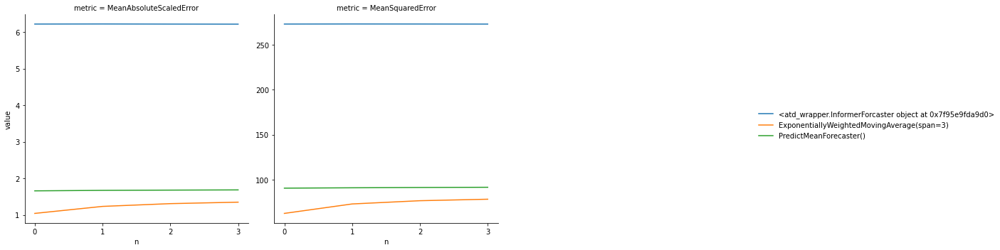

In [11]:
 metric_functions = [
    MeanAbsoluteScaledError(),
    MeanSquaredError(square_root=True),
]

metrics_df = atd2022.metrics.compute_metrics(
    truth,
    predictions,
    metric_functions,
    models=models,
    train=truth,
    verbose=True,
)

metrics_n = atd2022.metrics.compute_nstep_metrics(
    truth,
    predictions,
    metric_functions,
    models=models,
    train=truth,
    verbose=True,
)
display(metrics_df)
display(metrics_n)
display(atd2022.viz.plot_nstep_metrics(metrics_n))

In [ ]:
args = dotdict()


args.enc_in = 20 # encoder input size
args.dec_in = 20 # decoder input size
args.c_out = 20 # output size
args.factor = 5 # probsparse attn factor
args.d_model = 512 # dimension of model
args.n_heads = 8 # num of heads
args.e_layers = 3 # num of encoder layers
args.d_layers = 2 # num of decoder layers
args.d_ff = 2048 # dimension of fcn in model
args.dropout = 0.05 # dropout
args.attn = 'prob' # attention used in encoder, options:[prob, full]
args.embed = 'timeF' # time features encoding, options:[timeF, fixed, learned]
args.activation = 'gelu' # activation
args.distil = True # whether to use distilling in encoder
args.output_attention = False # whether to output attention in ecoder
args.mix = True
args.padding = 0
args.freq = 'w'
args.inverse=False
args.timeenc=1


args.use_gpu=True

#args.cols=1
args.checkpoints = "/scratch/wzong/atd_tmp"



args.seq_len=36
args.label_len=36
args.pred_len=1


args.batch_size = 45
args.learning_rate = 0.00001
args.loss = 'mse'
args.lradj = 'type2'
args.use_amp = False

args.itr=1
args.train_epochs=6
args.patience=5

In [ ]:
lispDL1 = InformerForcaster(args)

In [ ]:
 # Load data
truth = atd2022.io.read_csv()

# Subset the data for the sake of making this fast.
# Remove if you want to run the example on the entire dataset.
truth = truth.head(108)

# Experiment Parameters
window = 100
num_predict = 4
gap = 0
slide = 1

# Create a dataset `Splitter` object for generating train/test splits
splitter = atd2022.backtest.Splitter(
    truth,
    window,
    num_predict,
    gap,
    slide,
    expanding=True,
) 

In [ ]:
 # Populate a list of models that support the `atd2022.forecasters.Forecaster` protocol
# with which will we generate historical forecasts
models = [
    lispDL1,
    atd2022.forecasters.PredictMeanForecaster(),
    atd2022.forecasters.ExponentiallyWeightedMovingAverage(),
]

# Compute historical forecasts for all models
predictions = [
    atd2022.backtest.historical_forecast(model, splitter, verbose=True)
    for model in models
]

In [ ]:
 metric_functions = [
    MeanAbsoluteScaledError(),
    MeanSquaredError(square_root=True),
]

metrics_df = atd2022.metrics.compute_metrics(
    truth,
    predictions,
    metric_functions,
    models=models,
    train=truth,
    verbose=True,
)

metrics_n = atd2022.metrics.compute_nstep_metrics(
    truth,
    predictions,
    metric_functions,
    models=models,
    train=truth,
    verbose=True,
)
display(metrics_df)
display(metrics_n)
display(atd2022.viz.plot_nstep_metrics(metrics_n))